# Методы машинного обучения.

## ЛР7. - Классификатор на базе многослойного персептрона.

Осуществить генерацию исходных данных, которые представляют собой двумерное признаковое пространство, сгруппированное в 6 или более областей, отнесенных не менее чем к 4 классам (Пример взаимного расположения представлен на рисунке 1). В каждой области содержится не менее 50 примеров, и данные распределены по нормальному закону распределения.


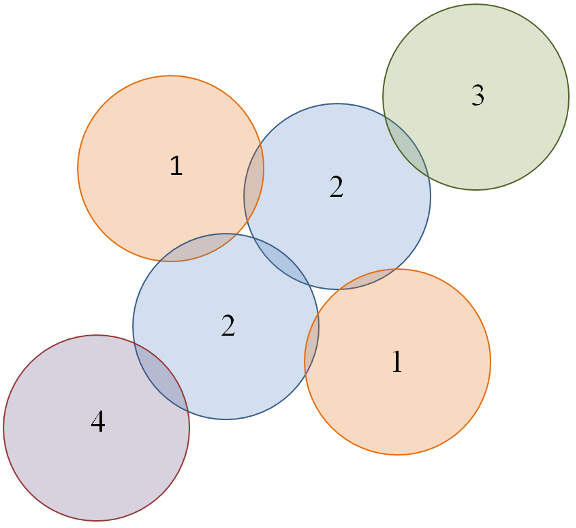

Рисунок 1. Пример взаимного расположения 6 областей относящихся к 4 классам.

Необходимо:
- Визуализировать сгенерированные данные на плоскости.
- Для  сгенерированного датасета осуществить построение классификатора на базе многослойного персептрона.
- Обосновать выбор числа слоев и нейронов в каждом слое.
- Сравнить работу нейросети в зависимости от выбранной функции активации (сигмоида с разными значениями параметра крутизны (b=1,b=100);  ReLU ).
- В процессе обучения визуализировать разделяющие поверхности промежуточного слоя.
- В процессе обучения построить графики изменения среднеквадратических ошибок на обучающей и тестовой  выборках. Обосновать момент остановки процесса обучения.
- Оценить точность, полноту, F-меру. Построить матрицу ошибок.
- Предусмотреть дополнительную возможность ввода пользователем новых, не входящих в сгенерированный датасет данных. Визуализировать их совместно с обучающей выборкой и разделяющими поверхностями, осуществить их классификацию.
- Обратите внимание, что новые данные (из предыдущего пункта), далеко отстоящие от известных областей, также уверенно классифицируются обученной моделью. Необходимо решить задачу классификации таких данных как аномальных. Одним из вариантов решения является добавление в имеющийся набор данных дополнительно сгенерированных равномерно распределенных примеров с новой меткой класса с последующим расширением и переобучением модели нейросети.


## Выполнение

In [ ]:
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from sklearn.neural_network._multilayer_perceptron import MLPClassifier
from sklearn.neural_network._base import ACTIVATIONS
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix, classification_report, matthews_corrcoef
import seaborn as sns

In [ ]:
import tensorflow
from tensorflow.keras import losses, metrics, optimizers
from tensorflow.keras.initializers import HeNormal, GlorotNormal
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, InputLayer
from tensorflow.keras import backend
from tensorflow.keras.utils import to_categorical
import tensorflow.math as tfm

In [ ]:
import warnings
warnings.filterwarnings('ignore')

[0 1 2 3]


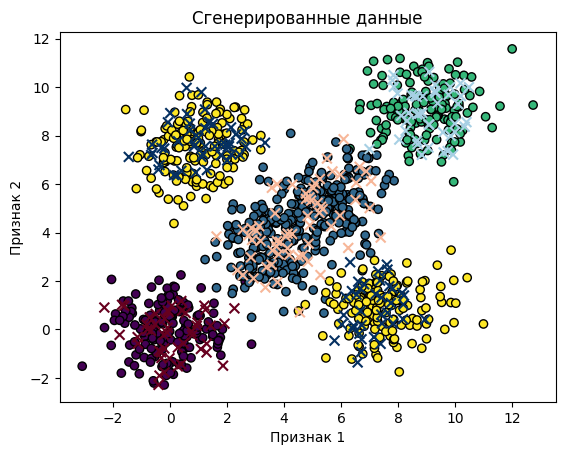

In [ ]:
centers = [[0, 0], [3.5, 3.5], [5.5, 5.5], [9, 9], [7.5, 1], [1, 7.5]]
X, y = make_blobs(n_samples=1200, centers=centers, random_state=7)
y = list(map(lambda x: x if (x < 2) else x - 1, y))
y = list(map(lambda x: x if (x < 4) else x - 1, y))

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
print(np.unique(y_test))

plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolors='k', label='Обучающая выборка')
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=plt.cm.RdBu, marker='x', s=50, label='Тестовая выборка')
plt.title('Сгенерированные данные')
plt.xlabel('Признак 1')
plt.ylabel('Признак 2')
plt.show()

In [ ]:
feature_vector_length = 2
num_classes = 4
input_shape = (feature_vector_length,)

In [ ]:
y_train = to_categorical(y_train, num_classes)
y_test = to_categorical(y_test, num_classes)

In [ ]:
def plot_surfaces(model, X_train, y_train, X_test, y_test, h=0.02):
    weights, biases = model.layers[-2].get_weights()
    print("Весовая матрица скрытого слоя:\n", weights)
    print("Смещения скрытого слоя:\n", biases)
    print()

    x_min, x_max = X[:, 0].min() - 6, X[:, 0].max() + 6
    y_min, y_max = X[:, 1].min() - 6, X[:, 1].max() + 6
    x_vals = np.linspace(x_min, x_max, 10)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(17,8))

    ax1.scatter(X_train[:,0], X_train[:,1], c=np.argmax(y_train, axis=1), cmap=plt.cm.RdBu, edgecolors='k', label='Обучающая выборка')
    ax1.scatter(X_test[:,0], X_test[:,1], c=np.argmax(y_test, axis=1), cmap=plt.cm.RdBu, marker='x', s=80, label='Тестовая выборка')
    colors = ['red', 'blue', 'green', 'orange', 'magenta', 'black']
    for i in range(len(weights[0])):
        w = weights[:, i]
        b = biases[i]
        print(w, b)

        if np.abs(w[0]) > 1e-6:
            y_vals = -(w[1]/w[0])*x_vals - (10*b)/w[0]
            ax1.plot(x_vals, y_vals, color=colors[i], linestyle='--',
                    label=f'Разделяющая линия для нейрона {i}')
    ax1.set_xlim(x_min, x_max)
    ax1.set_ylim(y_min, y_max)
    ax1.set_title("Разделяющие линии, полученные из весов нейронов скрытого слоя")
    ax1.set_xlabel("Признак 1")
    ax1.set_ylabel("Признак 2")
    ax1.legend()

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()], verbose=1)
    Z = np.argmax(Z, axis=1).reshape(xx.shape)

    ax2.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=.8)
    ax2.scatter(X_train[:, 0], X_train[:, 1], c=np.argmax(y_train, axis=1), cmap=plt.cm.RdBu, edgecolors='k', label='Обучающая выборка')
    ax2.scatter(X_test[:, 0], X_test[:, 1], c=np.argmax(y_test, axis=1), cmap=plt.cm.RdBu, marker='x', s=50, label='Тестовая выборка')
    ax2.set_title(f'Разделяющие поверхности')
    ax2.set_xlabel('Признак 1')
    ax2.set_ylabel('Признак 2')
    ax2.legend()

    plt.show()

In [ ]:
def plot_results(metrics, title=None, ylabel=None, xlim=None, ylim=None, metric_name=None, color=None):
    fig, ax = plt.subplots(figsize=(15, 4))

    if not (isinstance(metric_name, list) or isinstance(metric_name, tuple)):
        metrics = [metrics,]
        metric_name = [metric_name,]

    for idx, metric in enumerate(metrics):
        ax.plot(metric, color=color[idx])

    plt.xlabel("Epoch")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.xlim(xlim)
    plt.ylim(ylim)

    ax.xaxis.set_major_locator(MultipleLocator((xlim[1] - xlim[0])/10))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    plt.grid(True)
    plt.legend(metric_name)
    plt.show()
    plt.close()

In [ ]:
def learn(X_train, y_train, X_test, y_test, activation_input, activation_hidden, activation_output, additional_metrics=[]):
    num_classes = y_train.shape[1]
    print(num_classes)

    model = Sequential()
    initializer = GlorotNormal()
    # model.add(Dense(feature_vector_length, input_shape=input_shape, activation=activation_input, kernel_initializer=initializer))
    model.add(InputLayer(input_shape=input_shape, activation=activation_input, kernel_initializer=initializer))
    model.add(Dense(6, activation=activation_hidden, kernel_initializer=initializer))
    model.add(Dense(num_classes, activation=activation_output, kernel_initializer=initializer))

    metrics = ['accuracy']
    metrics.extend(additional_metrics)

    model.compile(
        loss='categorical_crossentropy',
        optimizer='adam',
        metrics=metrics,
    )

    max_epochs = 200
    epochs_per_iter = 25

    train_loss = []
    train_acc  = []
    valid_loss = []
    valid_acc  = []

    epoch = 0
    while epoch < max_epochs:
        training_results = model.fit(X_train, y_train, batch_size=16, initial_epoch=epoch, epochs=epoch+epochs_per_iter, verbose=1, validation_data=(X_test, y_test))

        print(training_results.history.keys())
        train_loss.extend(training_results.history["loss"])
        train_acc.extend(training_results.history["accuracy"])
        valid_loss.extend(training_results.history["val_loss"])
        valid_acc.extend(training_results.history["val_accuracy"])

        plot_surfaces(model, X_train, y_train, X_test, y_test, 0.05)

        epoch += epochs_per_iter

    plot_results([ train_loss, valid_loss ],
                ylabel="Loss",
                xlim = [0, max_epochs],
                ylim = [0.0, 1.5],
                metric_name=["Training Loss", "Validation Loss"],
                color=["g", "b"])

    plot_results([ train_acc, valid_acc ],
                ylabel="Accuracy",
                xlim = [0, max_epochs],
                ylim = [0.0, 1.0],
                metric_name=["Training Accuracy", "Validation Accuracy"],
                color=["g", "b"])

    y_pred = model.predict(X_test)

    print("\nClassification Report:")
    print(classification_report(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1)))
    print("\nAdditional Metrics:")
    mcc = matthews_corrcoef(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
    print(f"MCC: {mcc:.4f}\n")

    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    return model

4
Epoch 1/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.1948 - loss: 1.3516 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.4542 - val_loss: 1.2535 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3959 - loss: 1.2254 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.4917 - val_loss: 1.2037 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4995 - loss: 1.1772 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.3750 - val_loss: 1.1656 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4318 - loss: 1.1361 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.4292 - val_loss: 1.1211 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5794 - loss: 1.0904 - precision: 0.77

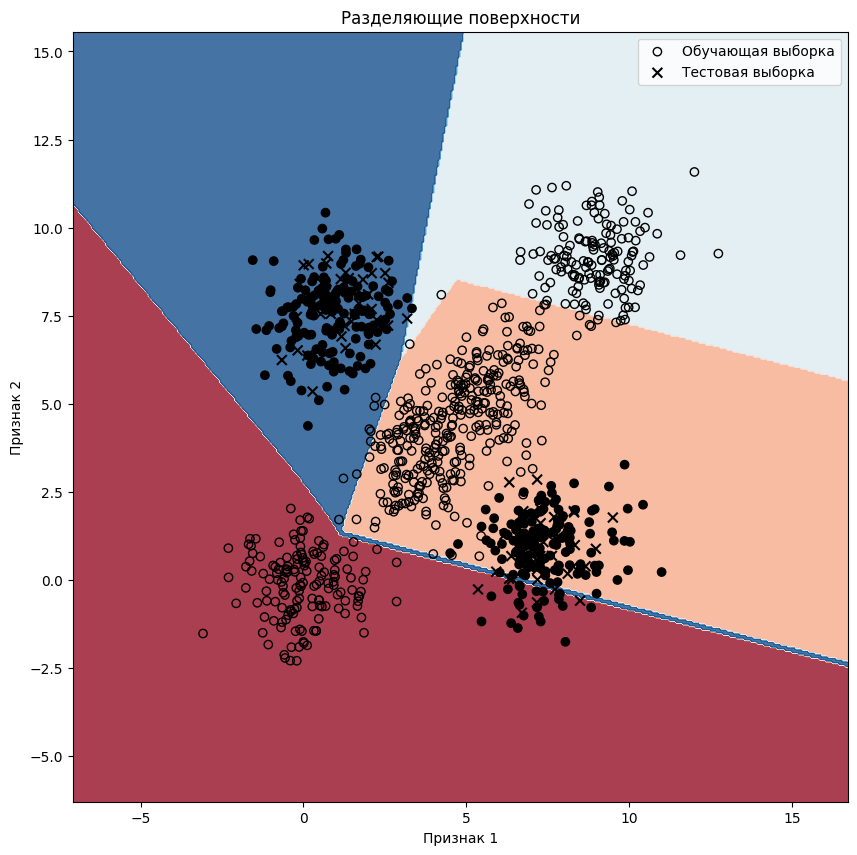

Epoch 26/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8037 - loss: 0.5654 - precision: 0.8562 - recall: 0.7689 - val_accuracy: 0.8458 - val_loss: 0.5408 - val_precision: 0.8889 - val_recall: 0.8000
Epoch 27/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8011 - loss: 0.5485 - precision: 0.8467 - recall: 0.7710 - val_accuracy: 0.8333 - val_loss: 0.5286 - val_precision: 0.8884 - val_recall: 0.7958
Epoch 28/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8284 - loss: 0.5225 - precision: 0.8656 - recall: 0.8049 - val_accuracy: 0.8375 - val_loss: 0.5160 - val_precision: 0.8894 - val_recall: 0.8042
Epoch 29/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7999 - loss: 0.5111 - precision: 0.8483 - recall: 0.7618 - val_accuracy: 0.8417 - val_loss: 0.5043 - val_precision: 0.8848 - val_recall: 0.8000
Epoch 30/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8526 - loss: 0.4921 - precision: 0.8812 - recall: 0.8252 - val_accuracy: 0.8625 - val_loss: 0.4945 

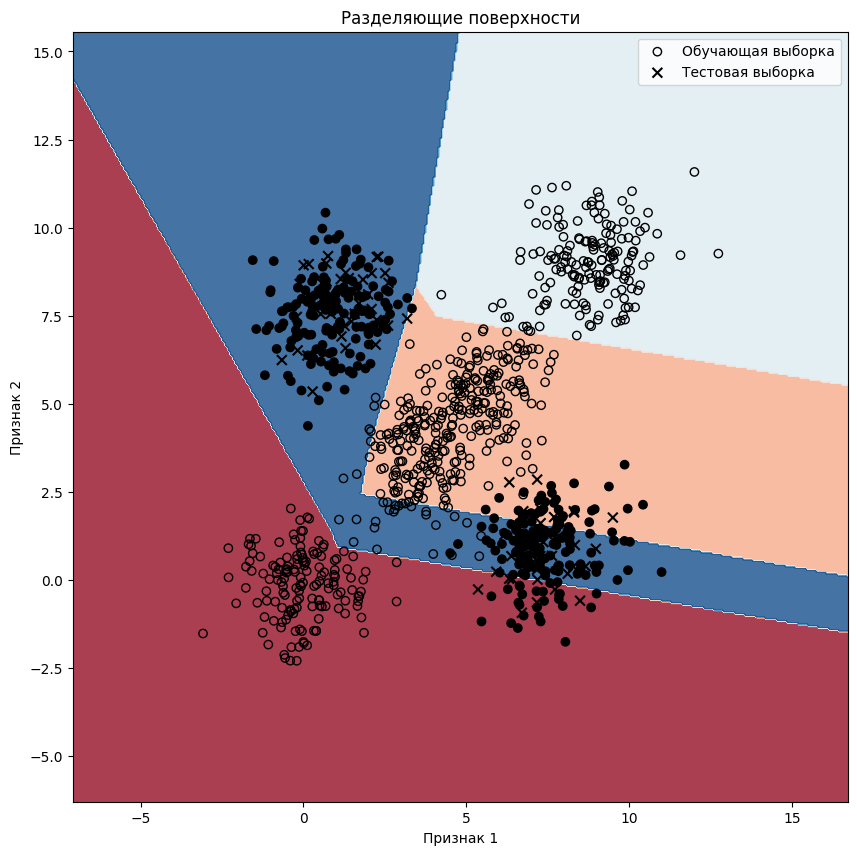

Epoch 51/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8846 - loss: 0.3556 - precision: 0.8978 - recall: 0.8702 - val_accuracy: 0.8833 - val_loss: 0.3427 - val_precision: 0.8856 - val_recall: 0.8708
Epoch 52/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8864 - loss: 0.3416 - precision: 0.8969 - recall: 0.8732 - val_accuracy: 0.8792 - val_loss: 0.3371 - val_precision: 0.8819 - val_recall: 0.8708
Epoch 53/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8901 - loss: 0.3328 - precision: 0.8981 - recall: 0.8805 - val_accuracy: 0.8750 - val_loss: 0.3336 - val_precision: 0.8819 - val_recall: 0.8708
Epoch 54/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8693 - loss: 0.3626 - precision: 0.8734 - recall: 0.8575 - val_accuracy: 0.8792 - val_loss: 0.3291 - val_precision: 0.8898 - val_recall: 0.8750
Epoch 55/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8934 - loss: 0.3274 - precision: 0.8938 - recall: 0.8766 - val_accuracy: 0.8792 - val_loss: 0.3265 

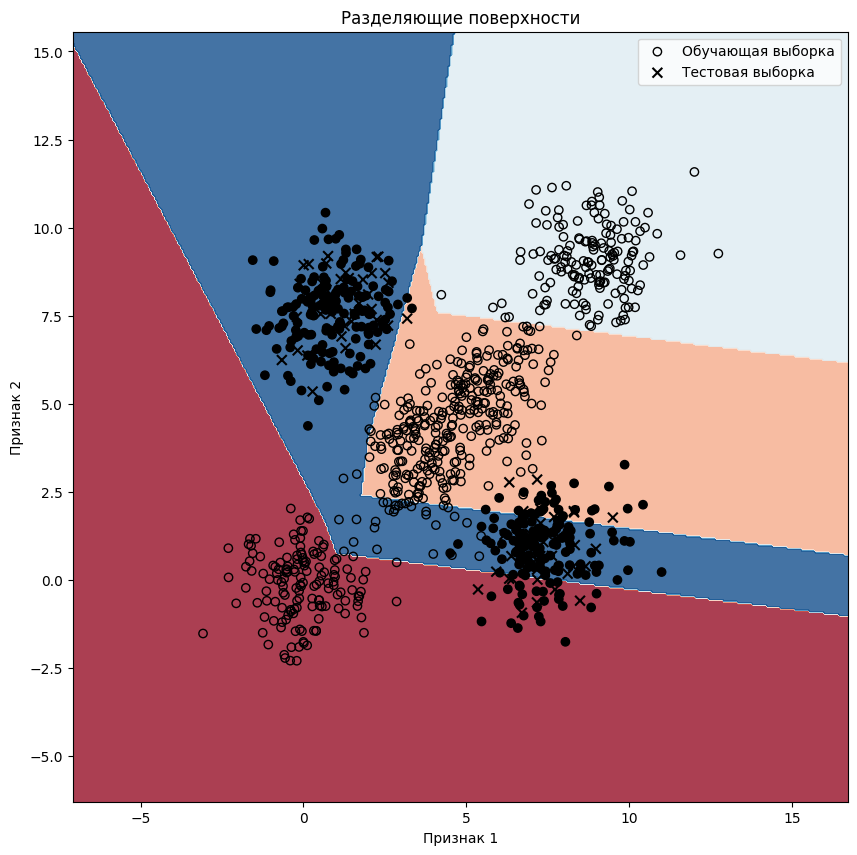

Epoch 76/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8890 - loss: 0.2894 - precision: 0.8910 - recall: 0.8845 - val_accuracy: 0.8833 - val_loss: 0.2778 - val_precision: 0.8833 - val_recall: 0.8833
Epoch 77/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9036 - loss: 0.2772 - precision: 0.9069 - recall: 0.9025 - val_accuracy: 0.8833 - val_loss: 0.2771 - val_precision: 0.8833 - val_recall: 0.8833
Epoch 78/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9105 - loss: 0.2499 - precision: 0.9117 - recall: 0.9058 - val_accuracy: 0.8833 - val_loss: 0.2753 - val_precision: 0.8828 - val_recall: 0.8792
Epoch 79/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.8854 - loss: 0.3262 - precision: 0.8871 - recall: 0.8850 - val_accuracy: 0.8792 - val_loss: 0.2769 - val_precision: 0.8787 - val_recall: 0.8750
Epoch 80/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8938 - loss: 0.2841 - precision: 0.8982 - recall: 0.8911 - val_accuracy: 0.8833 - val_loss: 0.

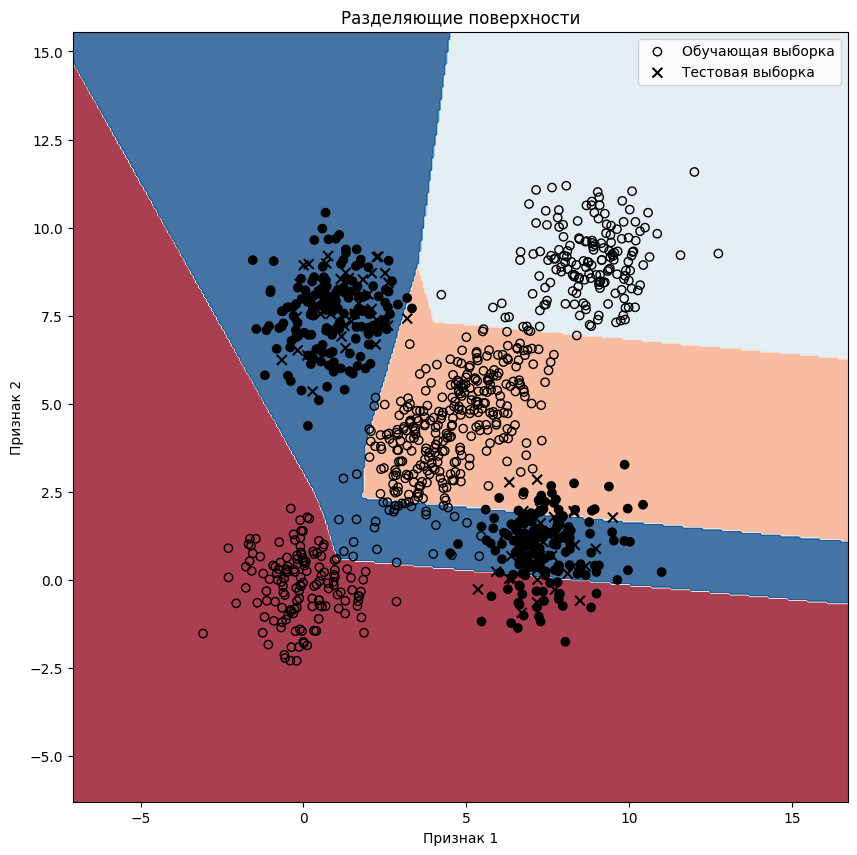

Epoch 101/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8934 - loss: 0.2509 - precision: 0.8936 - recall: 0.8933 - val_accuracy: 0.8875 - val_loss: 0.2487 - val_precision: 0.8875 - val_recall: 0.8875
Epoch 102/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9011 - loss: 0.2499 - precision: 0.9014 - recall: 0.9003 - val_accuracy: 0.8917 - val_loss: 0.2476 - val_precision: 0.8917 - val_recall: 0.8917
Epoch 103/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9001 - loss: 0.2588 - precision: 0.9005 - recall: 0.9001 - val_accuracy: 0.8833 - val_loss: 0.2513 - val_precision: 0.8870 - val_recall: 0.8833
Epoch 104/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8997 - loss: 0.2297 - precision: 0.9008 - recall: 0.8988 - val_accuracy: 0.8917 - val_loss: 0.2514 - val_precision: 0.8917 - val_recall: 0.8917
Epoch 105/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9038 - loss: 0.2625 - precision: 0.9042 - recall: 0.9016 - val_accuracy: 0.8875 - val_los

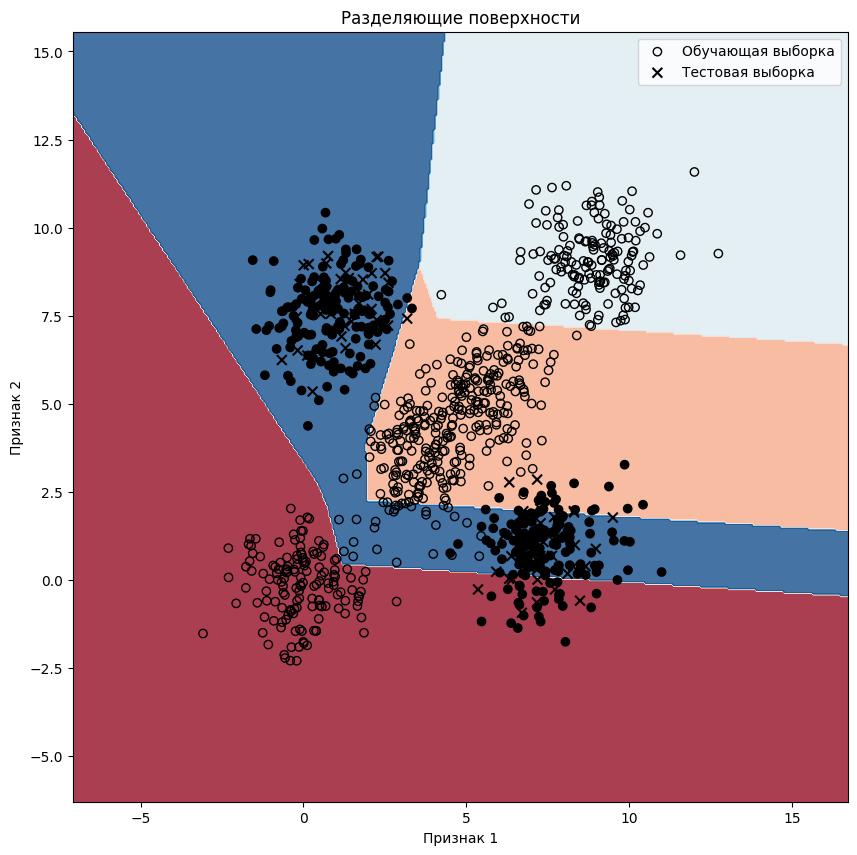

Epoch 126/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9074 - loss: 0.2256 - precision: 0.9071 - recall: 0.9045 - val_accuracy: 0.9000 - val_loss: 0.2221 - val_precision: 0.9000 - val_recall: 0.9000
Epoch 127/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8986 - loss: 0.2205 - precision: 0.8987 - recall: 0.8980 - val_accuracy: 0.8917 - val_loss: 0.2222 - val_precision: 0.8917 - val_recall: 0.8917
Epoch 128/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9143 - loss: 0.2116 - precision: 0.9156 - recall: 0.9137 - val_accuracy: 0.9000 - val_loss: 0.2197 - val_precision: 0.9000 - val_recall: 0.9000
Epoch 129/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9019 - loss: 0.2207 - precision: 0.9018 - recall: 0.9016 - val_accuracy: 0.8833 - val_loss: 0.2252 - val_precision: 0.8833 - val_recall: 0.8833
Epoch 130/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.8973 - loss: 0.2218 - precision: 0.9018 - recall: 0.8939 - val_accuracy: 0.9000 - val_los

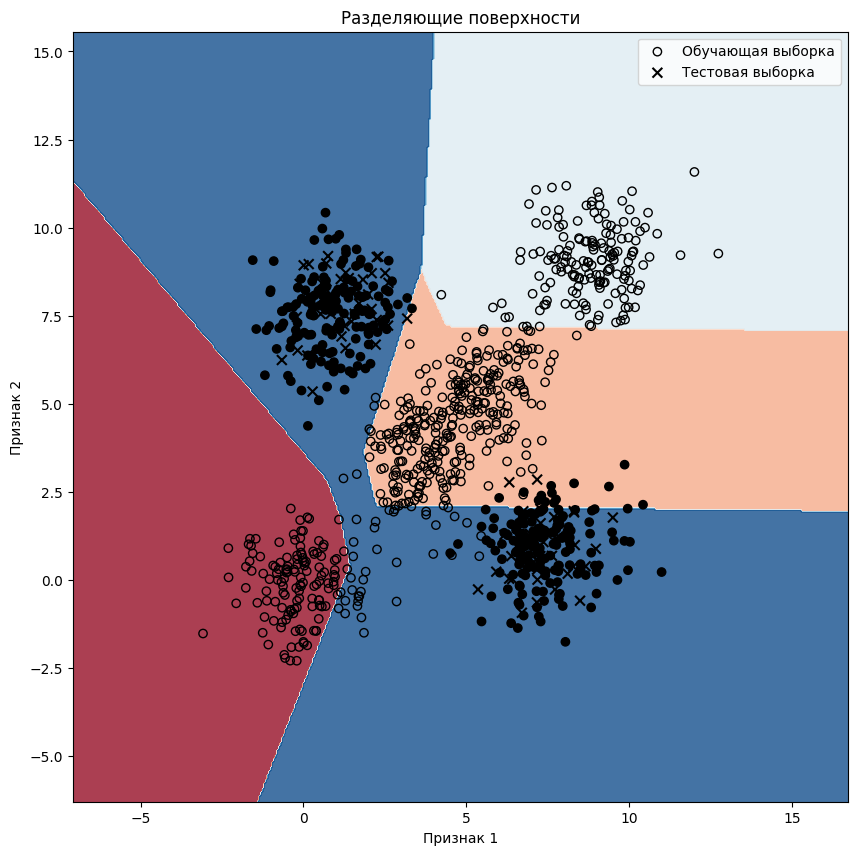

Epoch 151/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9214 - loss: 0.2156 - precision: 0.9214 - recall: 0.9214 - val_accuracy: 0.9250 - val_loss: 0.1967 - val_precision: 0.9247 - val_recall: 0.9208
Epoch 152/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9317 - loss: 0.1943 - precision: 0.9317 - recall: 0.9317 - val_accuracy: 0.9375 - val_loss: 0.1904 - val_precision: 0.9375 - val_recall: 0.9375
Epoch 153/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9317 - loss: 0.2158 - precision: 0.9317 - recall: 0.9317 - val_accuracy: 0.9375 - val_loss: 0.1902 - val_precision: 0.9375 - val_recall: 0.9375
Epoch 154/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9352 - loss: 0.1771 - precision: 0.9352 - recall: 0.9352 - val_accuracy: 0.9250 - val_loss: 0.1966 - val_precision: 0.9250 - val_recall: 0.9250
Epoch 155/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9440 - loss: 0.1711 - precision: 0.9438 - recall: 0.9411 - val_accuracy: 0.9375 - val_los

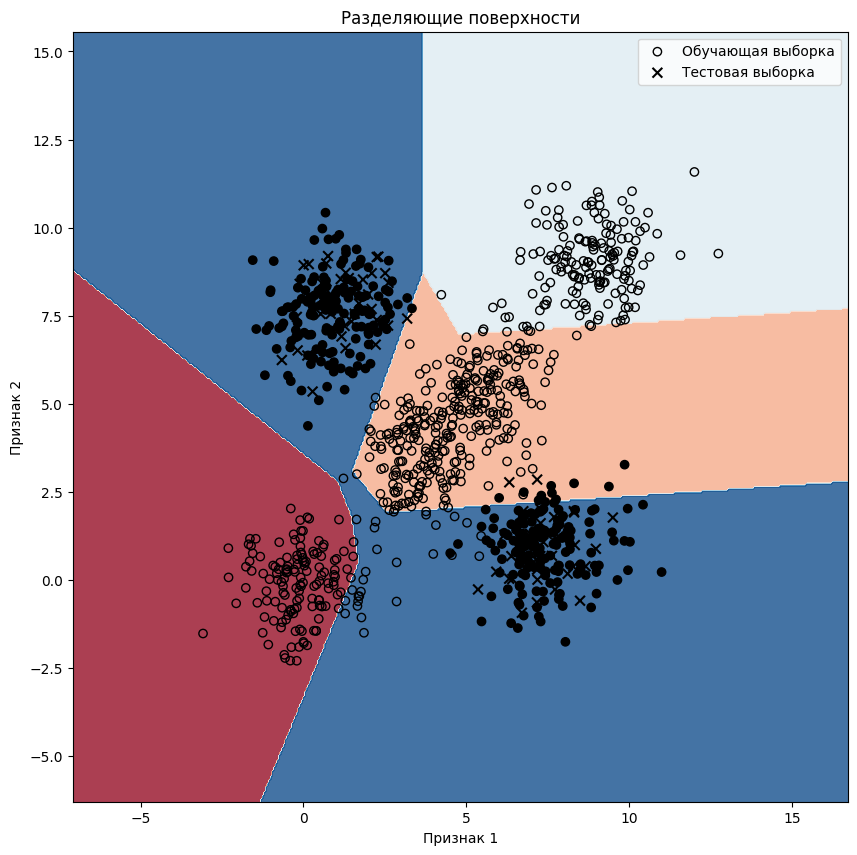

Epoch 176/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9472 - loss: 0.1603 - precision: 0.9472 - recall: 0.9472 - val_accuracy: 0.9333 - val_loss: 0.1679 - val_precision: 0.9333 - val_recall: 0.9333
Epoch 177/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9480 - loss: 0.1803 - precision: 0.9482 - recall: 0.9480 - val_accuracy: 0.9333 - val_loss: 0.1659 - val_precision: 0.9333 - val_recall: 0.9333
Epoch 178/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9417 - loss: 0.1559 - precision: 0.9424 - recall: 0.9417 - val_accuracy: 0.9333 - val_loss: 0.1646 - val_precision: 0.9333 - val_recall: 0.9333
Epoch 179/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9551 - loss: 0.1517 - precision: 0.9564 - recall: 0.9551 - val_accuracy: 0.9292 - val_loss: 0.1566 - val_precision: 0.9292 - val_recall: 0.9292
Epoch 180/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9469 - loss: 0.1594 - precision: 0.9481 - recall: 0.9469 - val_accuracy: 0.9333 - val_los

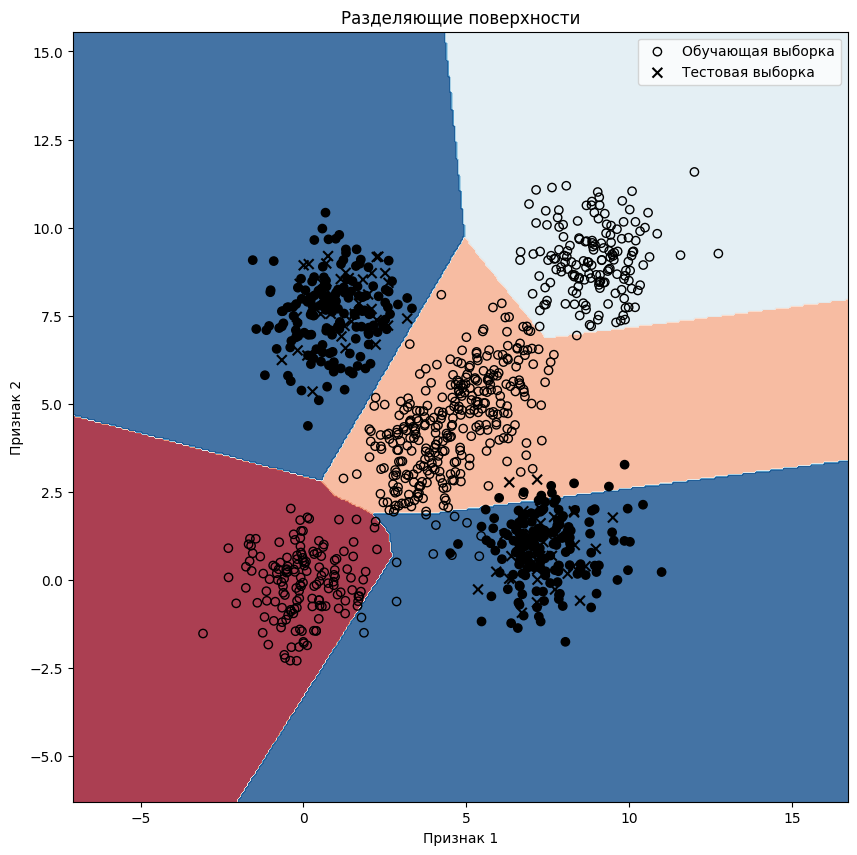

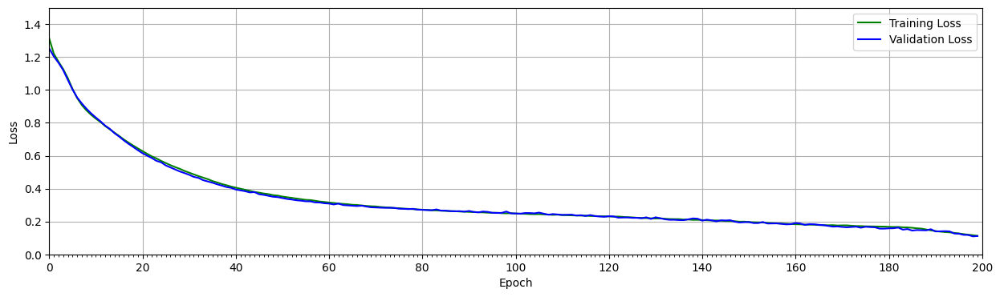

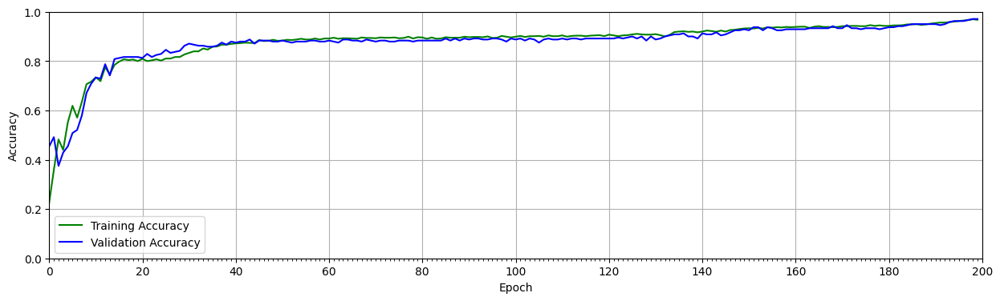

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        48
           1       0.95      0.96      0.95        77
           2       1.00      0.95      0.98        43
           3       0.96      0.97      0.97        72

    accuracy                           0.97       240
   macro avg       0.98      0.97      0.97       240
weighted avg       0.97      0.97      0.97       240


Additional Metrics:
MCC: 0.9603



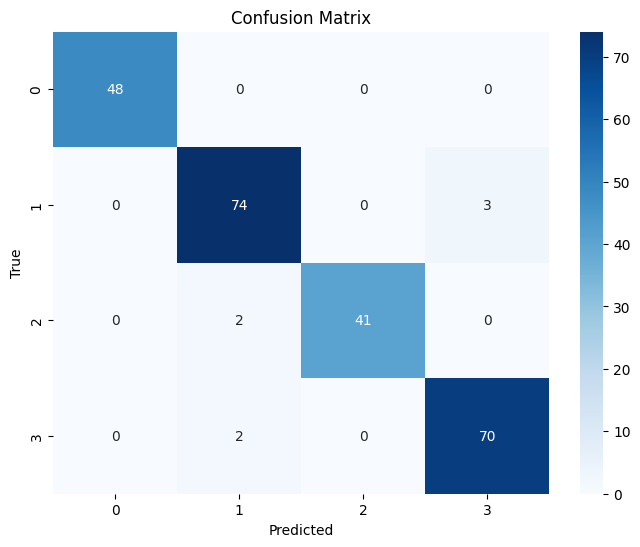

In [ ]:
model_1 = learn(X_train, y_train, X_test, y_test, 'relu', 'relu', 'softmax', ['precision', 'recall'])

4
Epoch 1/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.1601 - loss: 1.5329 - val_accuracy: 0.1792 - val_loss: 1.4443
Epoch 2/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1680 - loss: 1.4270 - val_accuracy: 0.1792 - val_loss: 1.3937
Epoch 3/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1746 - loss: 1.3777 - val_accuracy: 0.3250 - val_loss: 1.3660
Epoch 4/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3593 - loss: 1.3419 - val_accuracy: 0.3542 - val_loss: 1.3523
Epoch 5/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3949 - loss: 1.3244 - val_accuracy: 0.3958 - val_loss: 1.3426
Epoch 6/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4776 - loss: 1.3000 - val_accuracy: 0.4125 - val_loss: 1.3347
Epoch 7/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4487 - loss: 1.3050 - val_accuracy: 0.4333 - val_loss: 1.3281
Epoch 8/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4771 - loss: 1.2901 - val_accuracy: 0.4417 - val_los

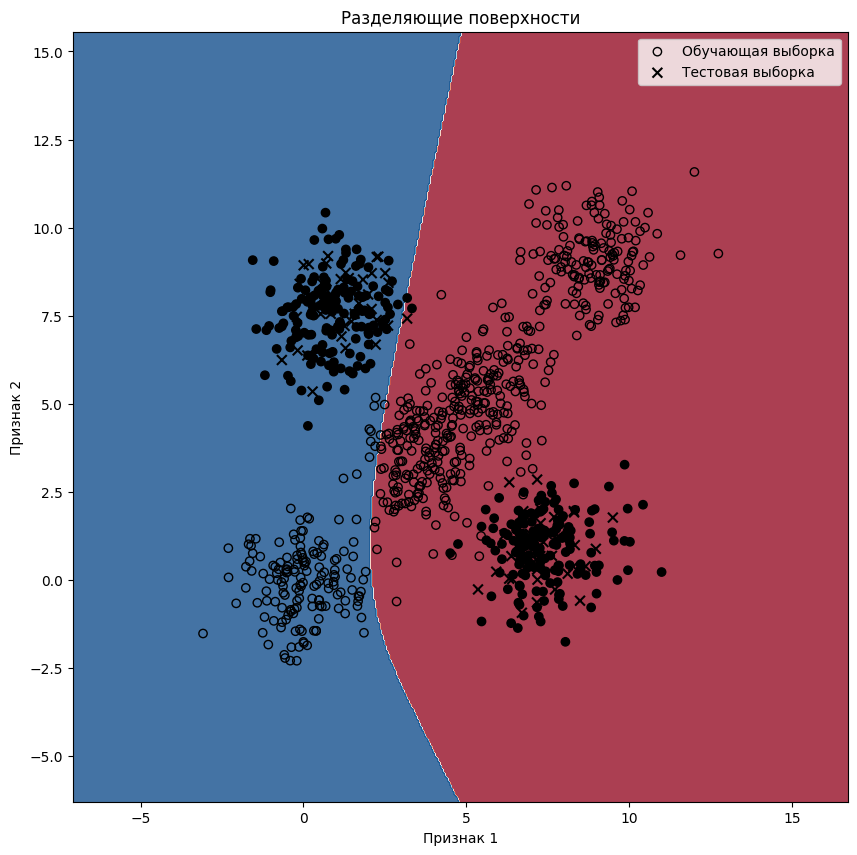

Epoch 26/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5029 - loss: 1.1070 - val_accuracy: 0.4417 - val_loss: 1.1295
Epoch 27/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5278 - loss: 1.0895 - val_accuracy: 0.4417 - val_loss: 1.1167
Epoch 28/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4765 - loss: 1.1033 - val_accuracy: 0.4417 - val_loss: 1.1035
Epoch 29/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4879 - loss: 1.0742 - val_accuracy: 0.4417 - val_loss: 1.0913
Epoch 30/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4723 - loss: 1.0754 - val_accuracy: 0.4417 - val_loss: 1.0788
Epoch 31/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4958 - loss: 1.0588 - val_accuracy: 0.4417 - val_loss: 1.0663
Epoch 32/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4895 - loss: 1.0531 - val_accuracy: 0.4667 - val_loss: 1.0537
Epoch 33/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5262 - loss: 1.0327 - val_accuracy: 0.5250 - v

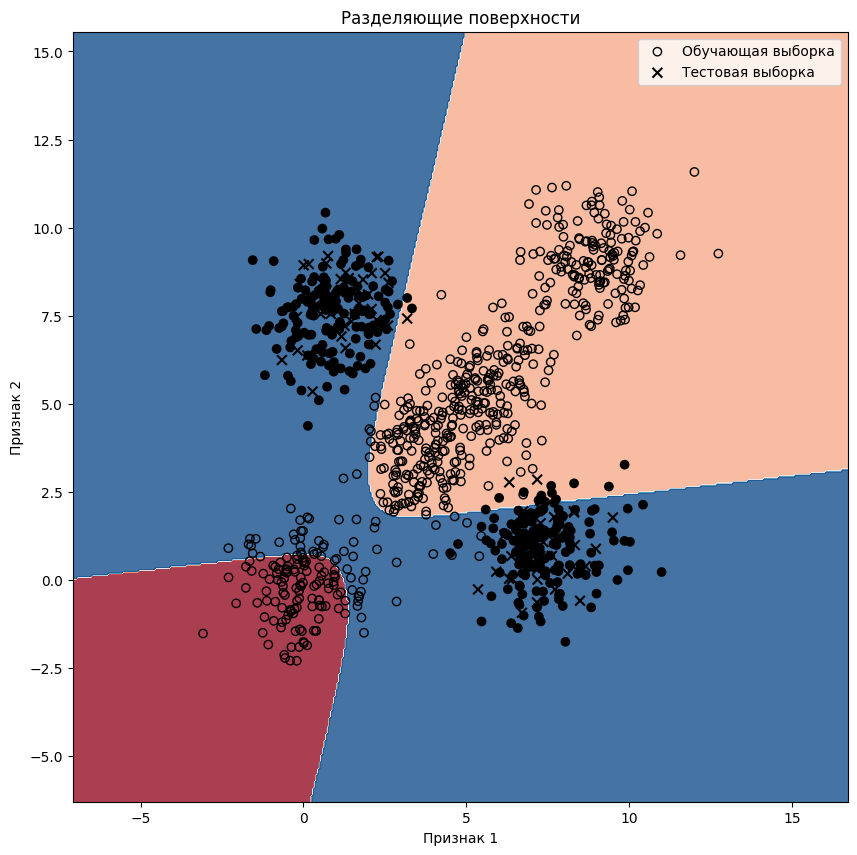

Epoch 51/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7463 - loss: 0.7807 - val_accuracy: 0.7042 - val_loss: 0.7869
Epoch 52/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7723 - loss: 0.7532 - val_accuracy: 0.7042 - val_loss: 0.7787
Epoch 53/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7591 - loss: 0.7524 - val_accuracy: 0.7042 - val_loss: 0.7700
Epoch 54/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7700 - loss: 0.7300 - val_accuracy: 0.7042 - val_loss: 0.7627
Epoch 55/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7603 - loss: 0.7357 - val_accuracy: 0.7042 - val_loss: 0.7546
Epoch 56/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7542 - loss: 0.7261 - val_accuracy: 0.7042 - val_loss: 0.7479
Epoch 57/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7519 - loss: 0.7244 - val_accuracy: 0.7042 - val_loss: 0.7407
Epoch 58/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7488 - loss: 0.7107 - val_accuracy: 0.7042 - v

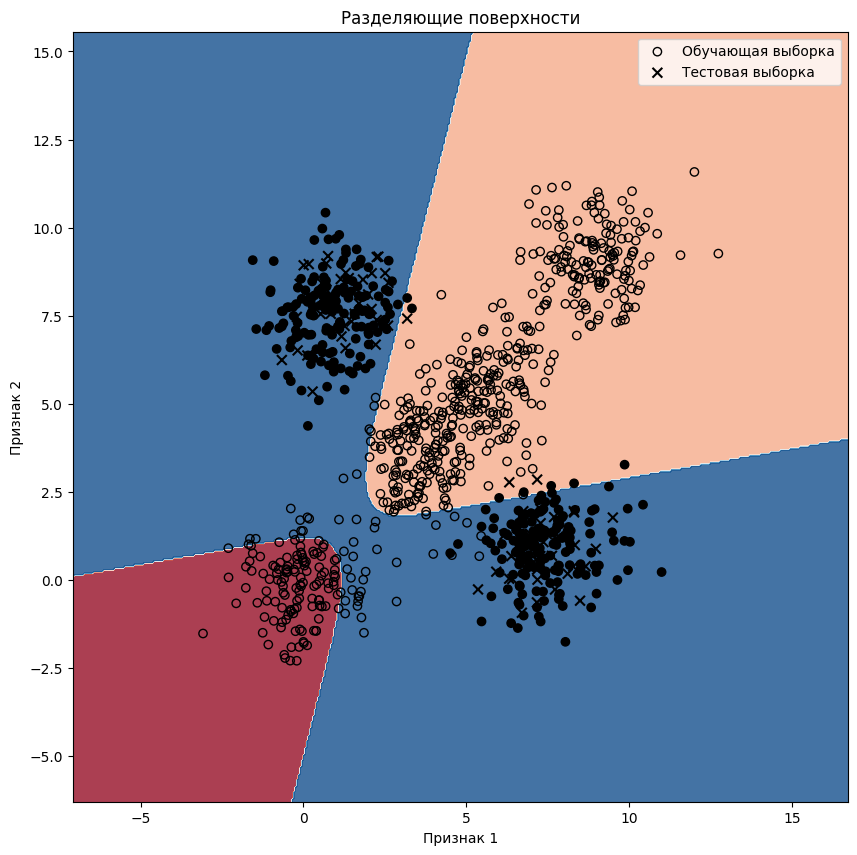

Epoch 76/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7764 - loss: 0.6240 - val_accuracy: 0.7500 - val_loss: 0.6411
Epoch 77/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7798 - loss: 0.6190 - val_accuracy: 0.7500 - val_loss: 0.6362
Epoch 78/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7784 - loss: 0.5995 - val_accuracy: 0.7500 - val_loss: 0.6317
Epoch 79/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7810 - loss: 0.5946 - val_accuracy: 0.7458 - val_loss: 0.6277
Epoch 80/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7912 - loss: 0.5980 - val_accuracy: 0.7458 - val_loss: 0.6232
Epoch 81/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7973 - loss: 0.5868 - val_accuracy: 0.7458 - val_loss: 0.6181
Epoch 82/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7917 - loss: 0.5825 - val_accuracy: 0.7458 - val_loss: 0.6142
Epoch 83/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7633 - loss: 0.6011 - val_accuracy: 0.

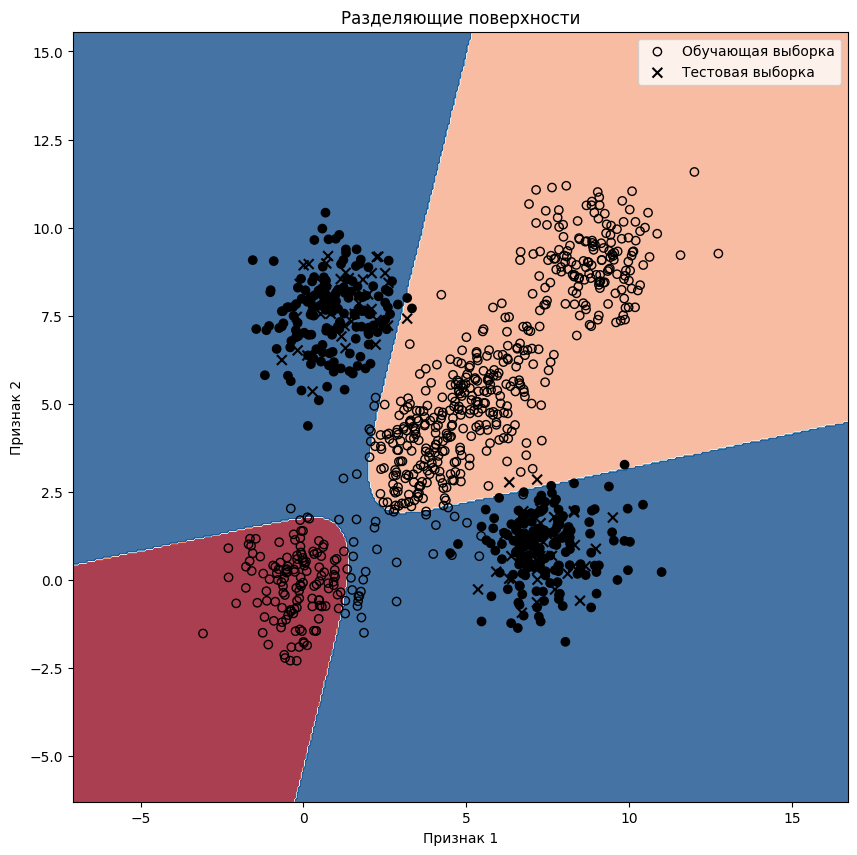

Epoch 101/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8044 - loss: 0.5115 - val_accuracy: 0.7625 - val_loss: 0.5388
Epoch 102/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7822 - loss: 0.5341 - val_accuracy: 0.7583 - val_loss: 0.5357
Epoch 103/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8115 - loss: 0.5000 - val_accuracy: 0.7625 - val_loss: 0.5327
Epoch 104/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8003 - loss: 0.4951 - val_accuracy: 0.7583 - val_loss: 0.5286
Epoch 105/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7944 - loss: 0.5105 - val_accuracy: 0.7583 - val_loss: 0.5250
Epoch 106/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7903 - loss: 0.5017 - val_accuracy: 0.7625 - val_loss: 0.5219
Epoch 107/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7890 - loss: 0.5146 - val_accuracy: 0.7625 - val_loss: 0.5190
Epoch 108/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7941 - loss: 0.5038 - val_accu

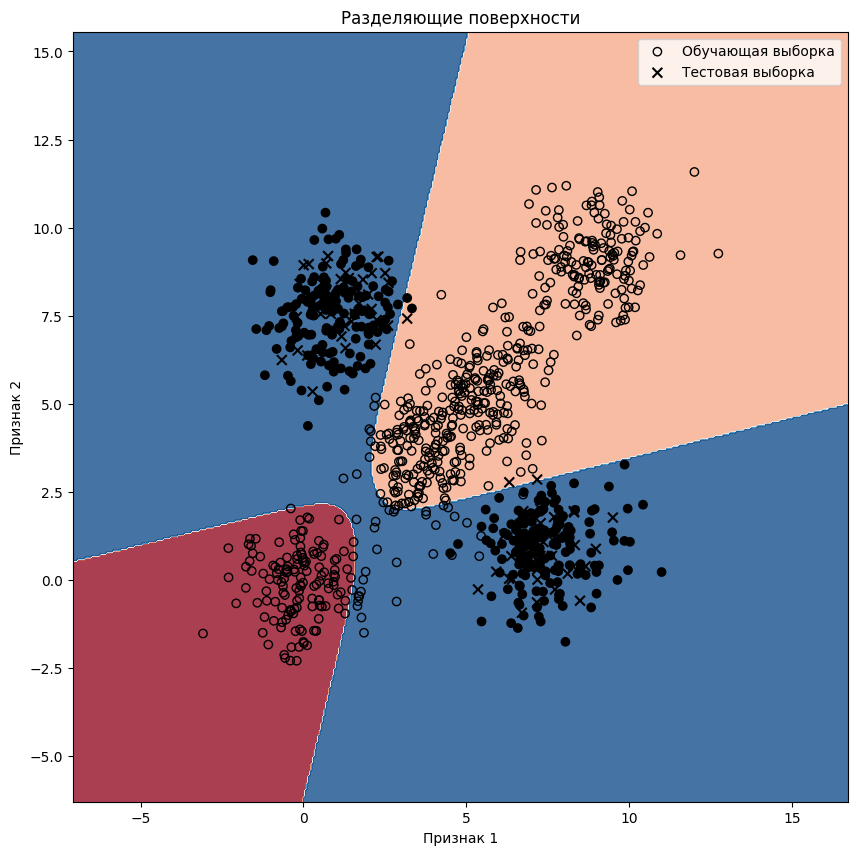

Epoch 126/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7847 - loss: 0.4823 - val_accuracy: 0.7625 - val_loss: 0.4646
Epoch 127/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7967 - loss: 0.4515 - val_accuracy: 0.7625 - val_loss: 0.4622
Epoch 128/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7812 - loss: 0.4579 - val_accuracy: 0.7625 - val_loss: 0.4596
Epoch 129/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8005 - loss: 0.4471 - val_accuracy: 0.7625 - val_loss: 0.4579
Epoch 130/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7947 - loss: 0.4456 - val_accuracy: 0.7625 - val_loss: 0.4542
Epoch 131/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7908 - loss: 0.4468 - val_accuracy: 0.7625 - val_loss: 0.4519
Epoch 132/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7785 - loss: 0.4534 - val_accuracy: 0.7667 - val_loss: 0.4494
Epoch 133/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8190 - loss: 0.4416 - val_accu

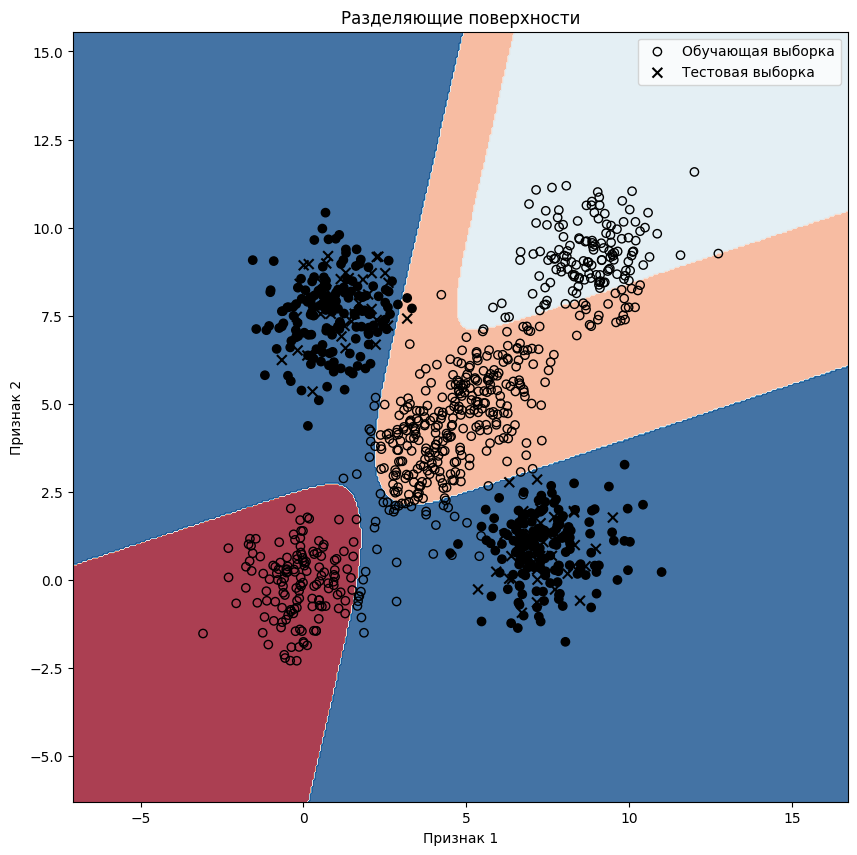

Epoch 151/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9123 - loss: 0.4016 - val_accuracy: 0.9000 - val_loss: 0.3985
Epoch 152/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9181 - loss: 0.3925 - val_accuracy: 0.9125 - val_loss: 0.3951
Epoch 153/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9280 - loss: 0.3902 - val_accuracy: 0.9125 - val_loss: 0.3923
Epoch 154/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9245 - loss: 0.3655 - val_accuracy: 0.9167 - val_loss: 0.3889
Epoch 155/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9213 - loss: 0.3758 - val_accuracy: 0.9167 - val_loss: 0.3870
Epoch 156/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9154 - loss: 0.3877 - val_accuracy: 0.9083 - val_loss: 0.3857
Epoch 157/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9312 - loss: 0.3665 - val_accuracy: 0.9167 - val_loss: 0.3829
Epoch 158/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9293 - loss: 0.3566 - val_accu

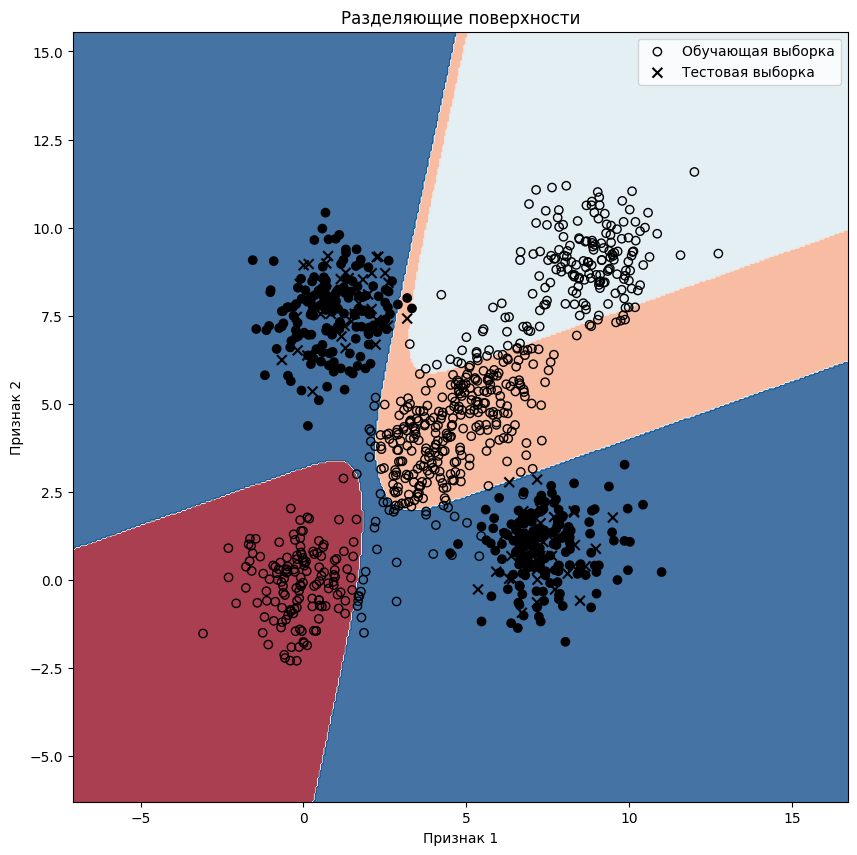

Epoch 176/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9192 - loss: 0.3218 - val_accuracy: 0.9083 - val_loss: 0.3324
Epoch 177/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8913 - loss: 0.3451 - val_accuracy: 0.9125 - val_loss: 0.3322
Epoch 178/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9120 - loss: 0.3332 - val_accuracy: 0.9042 - val_loss: 0.3285
Epoch 179/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9309 - loss: 0.2868 - val_accuracy: 0.9250 - val_loss: 0.3291
Epoch 180/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9194 - loss: 0.3084 - val_accuracy: 0.9083 - val_loss: 0.3242
Epoch 181/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9269 - loss: 0.3122 - val_accuracy: 0.9083 - val_loss: 0.3213
Epoch 182/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9265 - loss: 0.3114 - val_accuracy: 0.9208 - val_loss: 0.3214
Epoch 183/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9161 - loss: 0.3072 - val_accu

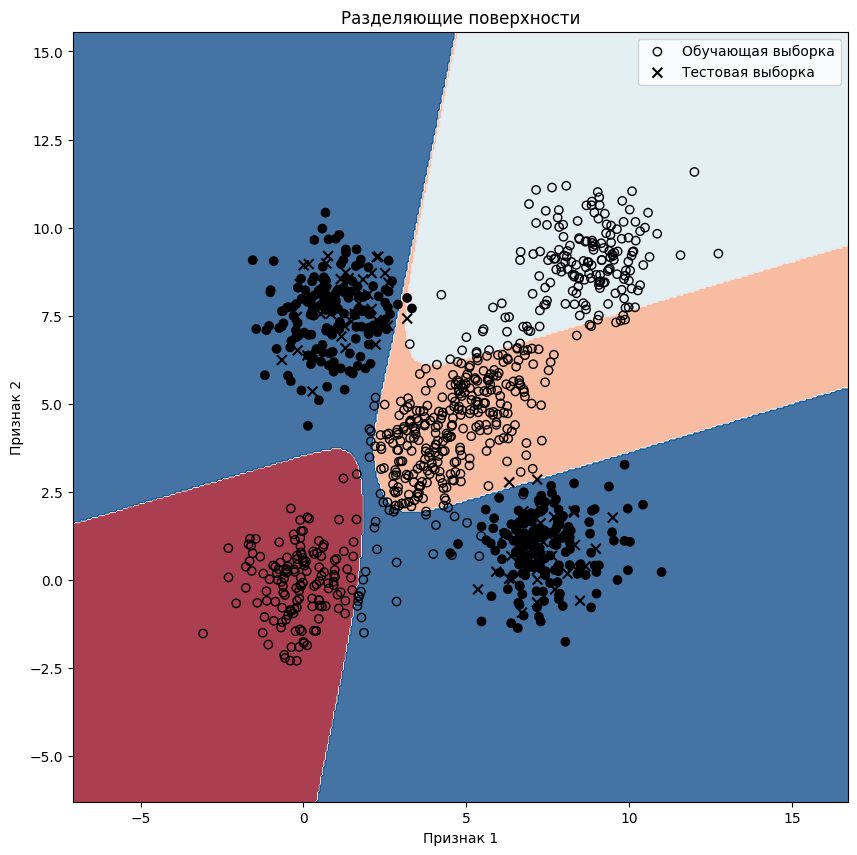

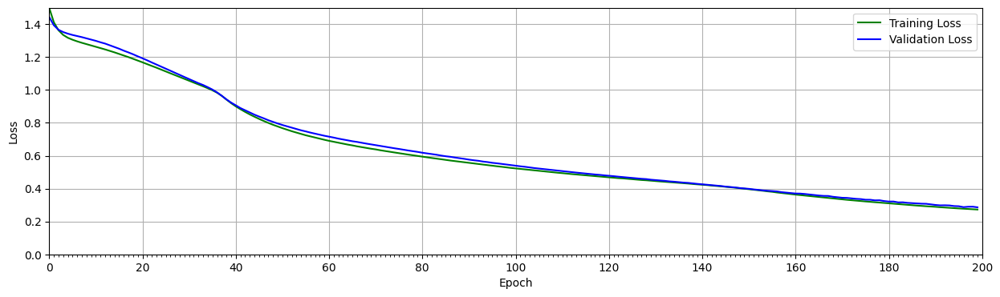

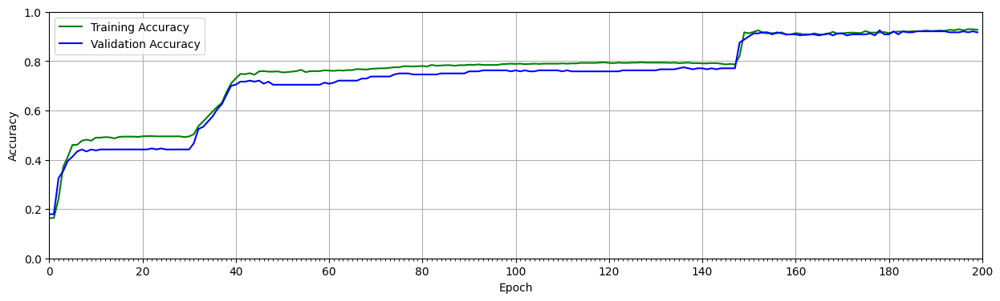

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        48
           1       0.90      0.84      0.87        77
           2       0.90      0.88      0.89        43
           3       0.88      0.96      0.92        72

    accuracy                           0.92       240
   macro avg       0.92      0.92      0.92       240
weighted avg       0.92      0.92      0.92       240


Additional Metrics:
MCC: 0.8873



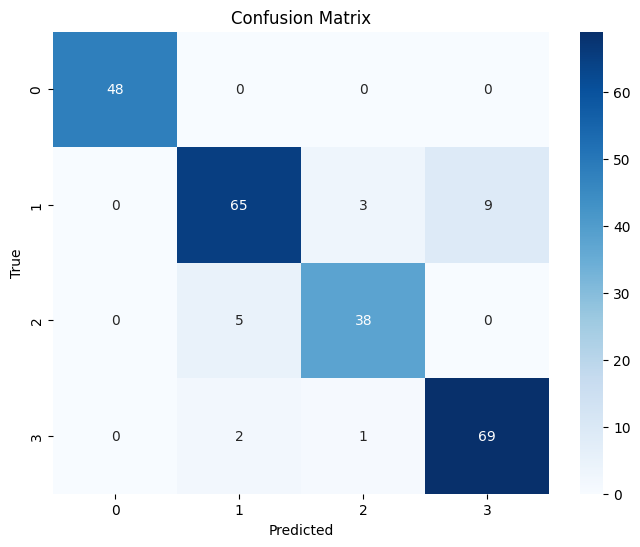

In [ ]:
model_2 = learn(X_train, y_train, X_test, y_test, 'sigmoid', 'sigmoid', 'softmax')

4
Epoch 1/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.3464 - loss: 1.5086 - val_accuracy: 0.2625 - val_loss: 1.4306
Epoch 2/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3564 - loss: 1.4144 - val_accuracy: 0.2875 - val_loss: 1.2750
Epoch 3/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3819 - loss: 1.2648 - val_accuracy: 0.4792 - val_loss: 1.1628
Epoch 4/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5515 - loss: 1.1716 - val_accuracy: 0.4500 - val_loss: 1.0131
Epoch 5/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3345 - loss: 1.0452 - val_accuracy: 0.4833 - val_loss: 0.9407
Epoch 6/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4148 - loss: 0.9442 - val_accuracy: 0.4875 - val_loss: 0.8606
Epoch 7/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4250 - loss: 0.8642 - val_accuracy: 0.4917 - val_loss: 0.7805
Epoch 8/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4438 - loss: 0.8051 - val_accuracy: 0.4917 - val_los

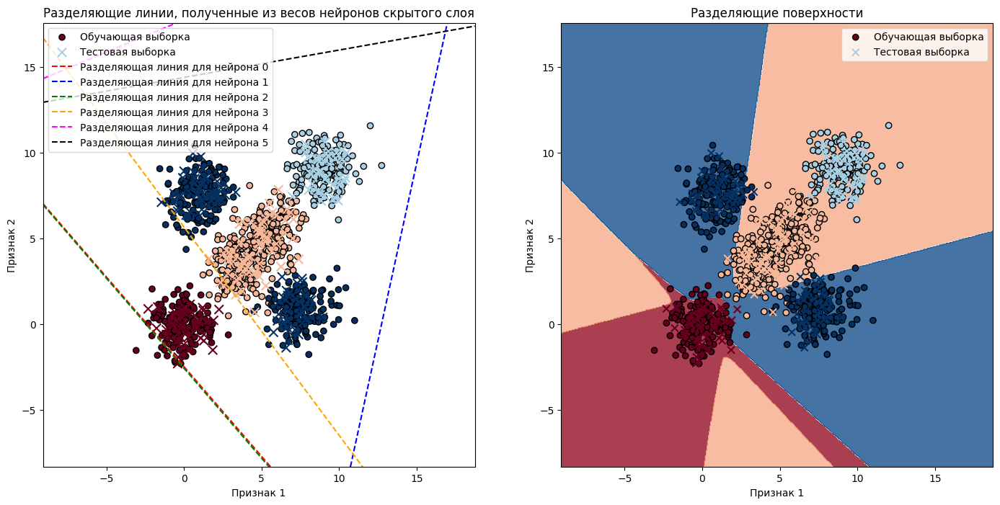

Epoch 26/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7679 - loss: 0.4140 - val_accuracy: 0.7750 - val_loss: 0.3819
Epoch 27/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7867 - loss: 0.3950 - val_accuracy: 0.7917 - val_loss: 0.3375
Epoch 28/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7954 - loss: 0.3791 - val_accuracy: 0.7792 - val_loss: 0.3795
Epoch 29/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8193 - loss: 0.3676 - val_accuracy: 0.7917 - val_loss: 0.3400
Epoch 30/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8221 - loss: 0.3485 - val_accuracy: 0.7833 - val_loss: 0.3148
Epoch 31/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7971 - loss: 0.3597 - val_accuracy: 0.7875 - val_loss: 0.3267
Epoch 32/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8072 - loss: 0.3360 - val_accuracy: 0.7833 - val_loss: 0.2955
Epoch 33/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8587 - loss: 0.3509 - val_accuracy: 0.7875 - v

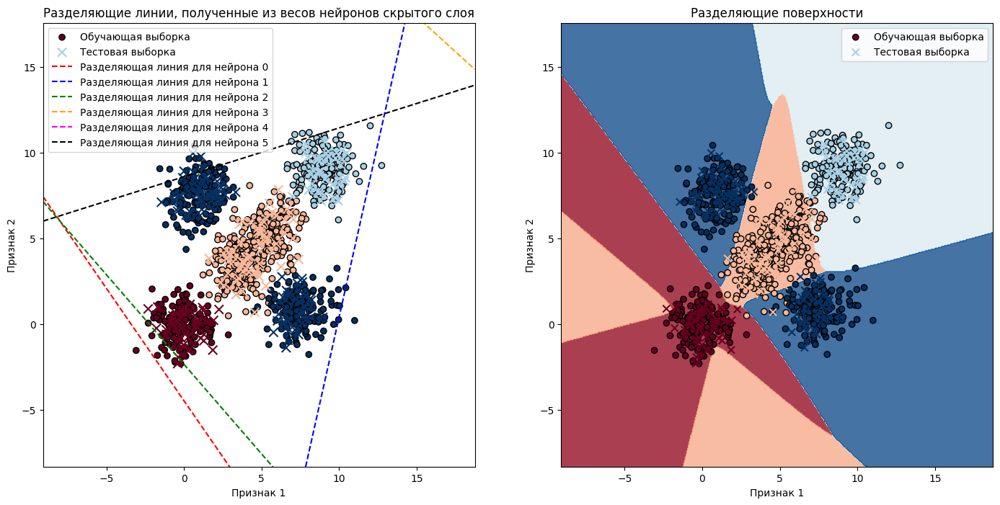

Epoch 51/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9784 - loss: 0.0767 - val_accuracy: 0.9792 - val_loss: 0.0880
Epoch 52/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9648 - loss: 0.1283 - val_accuracy: 0.9792 - val_loss: 0.0871
Epoch 53/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9789 - loss: 0.0791 - val_accuracy: 0.9750 - val_loss: 0.0880
Epoch 54/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9775 - loss: 0.0859 - val_accuracy: 0.9750 - val_loss: 0.0818
Epoch 55/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9771 - loss: 0.0936 - val_accuracy: 0.9792 - val_loss: 0.0782
Epoch 56/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9742 - loss: 0.1053 - val_accuracy: 0.9750 - val_loss: 0.0841
Epoch 57/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9748 - loss: 0.0882 - val_accuracy: 0.9750 - val_loss: 0.0827
Epoch 58/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9712 - loss: 0.0949 - val_accuracy: 0.9750 - v

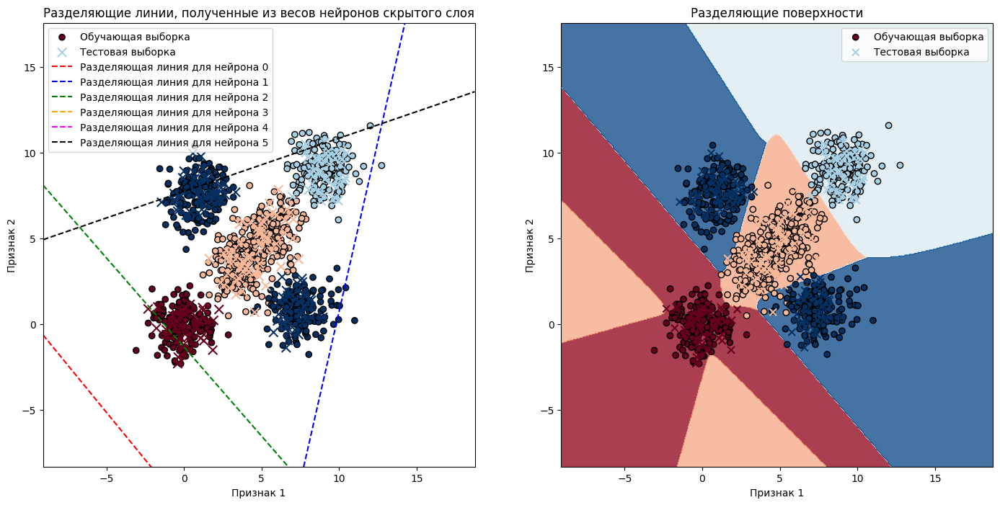

Epoch 76/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9854 - loss: 0.0566 - val_accuracy: 0.9833 - val_loss: 0.0578
Epoch 77/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9792 - loss: 0.0635 - val_accuracy: 0.9792 - val_loss: 0.0589
Epoch 78/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9848 - loss: 0.0532 - val_accuracy: 0.9833 - val_loss: 0.0579
Epoch 79/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9832 - loss: 0.0736 - val_accuracy: 0.9792 - val_loss: 0.0689
Epoch 80/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9798 - loss: 0.0668 - val_accuracy: 0.9792 - val_loss: 0.0533
Epoch 81/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9866 - loss: 0.0515 - val_accuracy: 0.9792 - val_loss: 0.0650
Epoch 82/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9826 - loss: 0.0625 - val_accuracy: 0.9833 - val_loss: 0.0596
Epoch 83/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9815 - loss: 0.0588 - val_accuracy: 0.

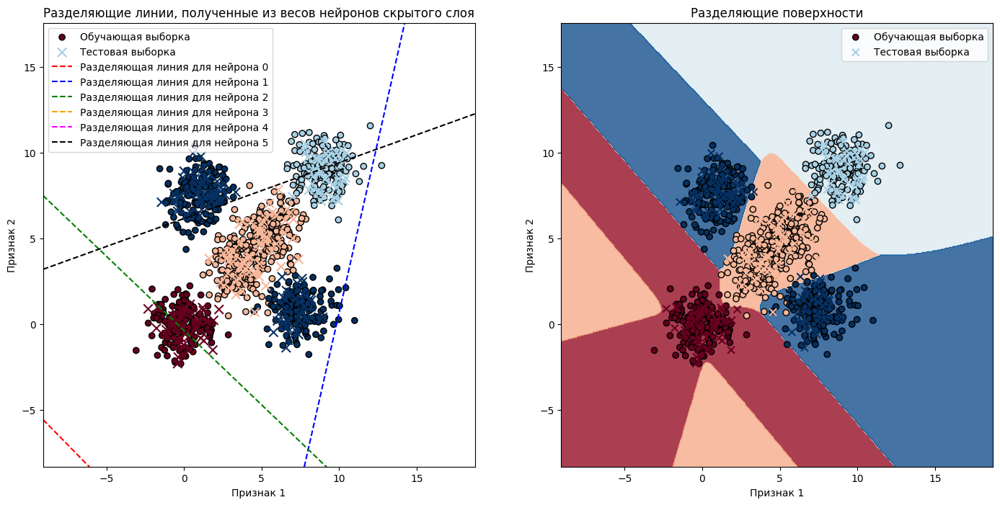

Epoch 101/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9835 - loss: 0.0543 - val_accuracy: 0.9750 - val_loss: 0.0530
Epoch 102/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9818 - loss: 0.0669 - val_accuracy: 0.9792 - val_loss: 0.0554
Epoch 103/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9798 - loss: 0.0502 - val_accuracy: 0.9792 - val_loss: 0.0585
Epoch 104/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9837 - loss: 0.0771 - val_accuracy: 0.9792 - val_loss: 0.0554
Epoch 105/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9821 - loss: 0.0456 - val_accuracy: 0.9833 - val_loss: 0.0536
Epoch 106/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9901 - loss: 0.0445 - val_accuracy: 0.9833 - val_loss: 0.0542
Epoch 107/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9745 - loss: 0.0708 - val_accuracy: 0.9750 - val_loss: 0.0530
Epoch 108/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9808 - loss: 0.0720 - val_accu

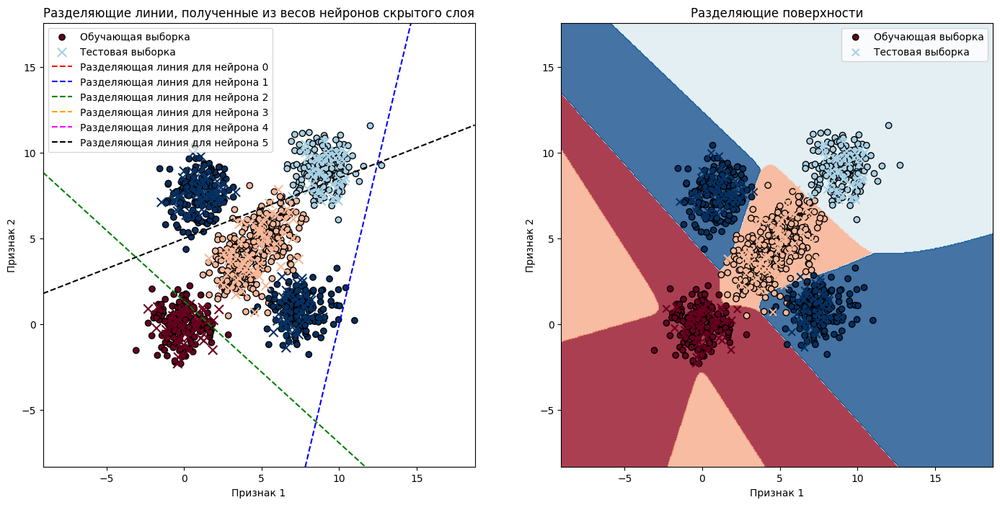

Epoch 126/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9853 - loss: 0.0530 - val_accuracy: 0.9792 - val_loss: 0.0505
Epoch 127/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9834 - loss: 0.0562 - val_accuracy: 0.9750 - val_loss: 0.0427
Epoch 128/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9854 - loss: 0.0479 - val_accuracy: 0.9875 - val_loss: 0.0438
Epoch 129/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9862 - loss: 0.0499 - val_accuracy: 0.9833 - val_loss: 0.0438
Epoch 130/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9831 - loss: 0.0443 - val_accuracy: 0.9875 - val_loss: 0.0482
Epoch 131/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9806 - loss: 0.0703 - val_accuracy: 0.9833 - val_loss: 0.0492
Epoch 132/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9832 - loss: 0.0527 - val_accuracy: 0.9833 - val_loss: 0.0472
Epoch 133/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9842 - loss: 0.0566 - val_accu

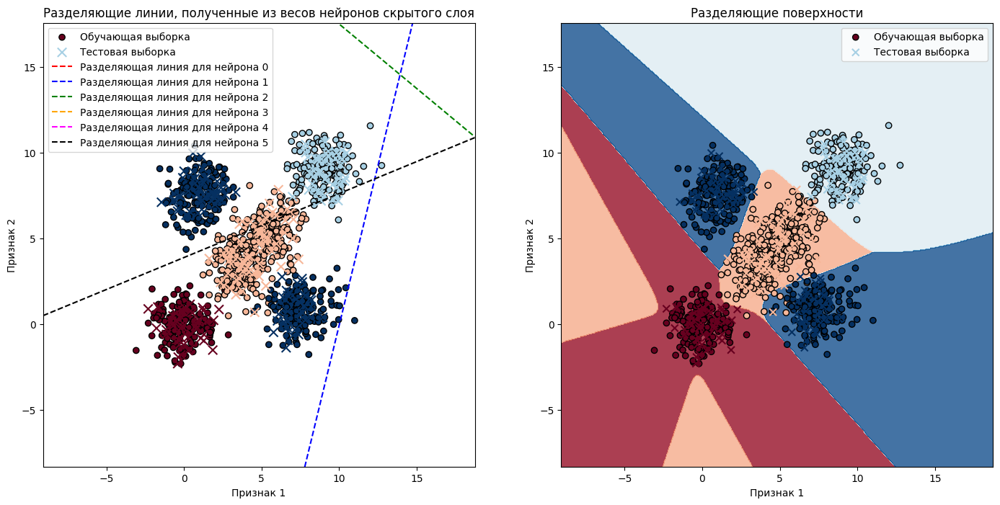

Epoch 151/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9848 - loss: 0.0565 - val_accuracy: 0.9792 - val_loss: 0.0465
Epoch 152/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9829 - loss: 0.0690 - val_accuracy: 0.9833 - val_loss: 0.0462
Epoch 153/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9890 - loss: 0.0354 - val_accuracy: 0.9875 - val_loss: 0.0371
Epoch 154/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9845 - loss: 0.0462 - val_accuracy: 0.9833 - val_loss: 0.0392
Epoch 155/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9872 - loss: 0.0478 - val_accuracy: 0.9833 - val_loss: 0.0361
Epoch 156/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9907 - loss: 0.0315 - val_accuracy: 0.9792 - val_loss: 0.0558
Epoch 157/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9861 - loss: 0.0543 - val_accuracy: 0.9833 - val_loss: 0.0352
Epoch 158/175
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9813 - loss: 0.0772 - val_accu

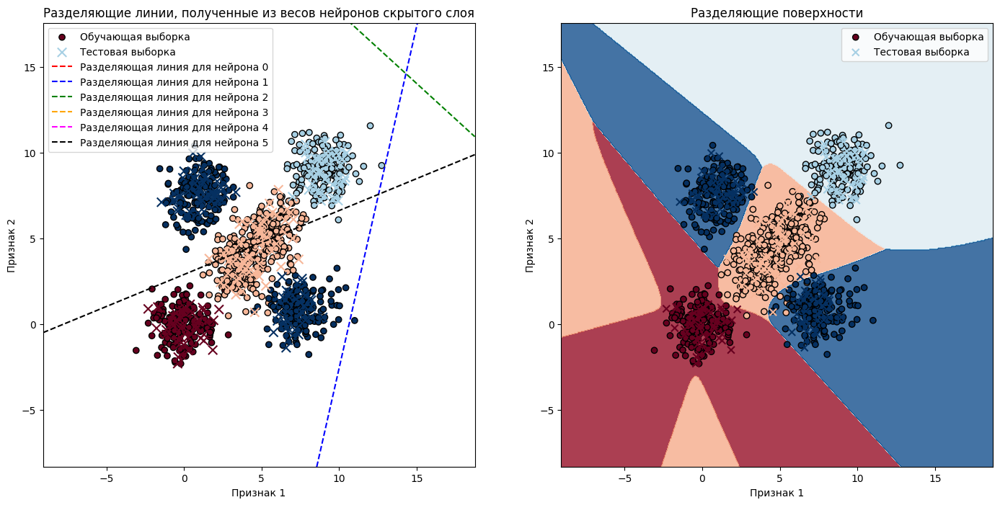

Epoch 176/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9881 - loss: 0.0427 - val_accuracy: 0.9833 - val_loss: 0.0351
Epoch 177/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9863 - loss: 0.0531 - val_accuracy: 0.9833 - val_loss: 0.0411
Epoch 178/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9866 - loss: 0.0519 - val_accuracy: 0.9875 - val_loss: 0.0362
Epoch 179/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9899 - loss: 0.0304 - val_accuracy: 0.9792 - val_loss: 0.0333
Epoch 180/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9883 - loss: 0.0398 - val_accuracy: 0.9833 - val_loss: 0.0363
Epoch 181/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9925 - loss: 0.0430 - val_accuracy: 0.9875 - val_loss: 0.0384
Epoch 182/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9762 - loss: 0.0520 - val_accuracy: 0.9875 - val_loss: 0.0337
Epoch 183/200
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9907 - loss: 0.0345 - val_accu

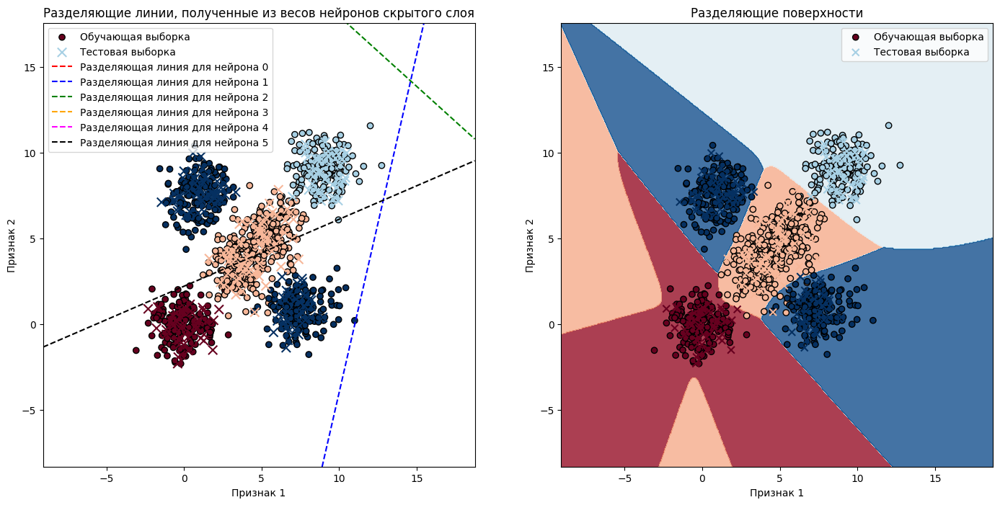

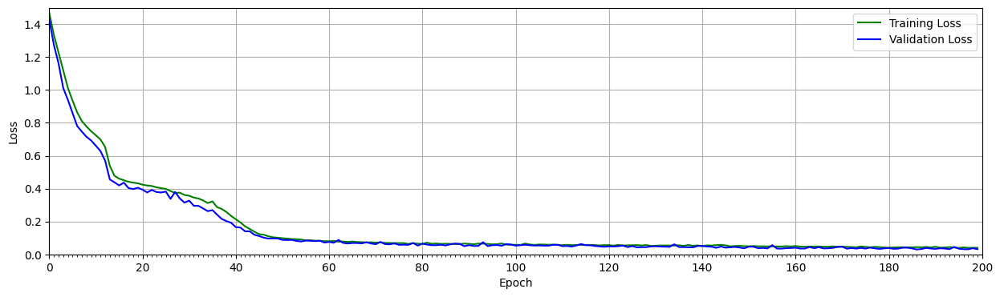

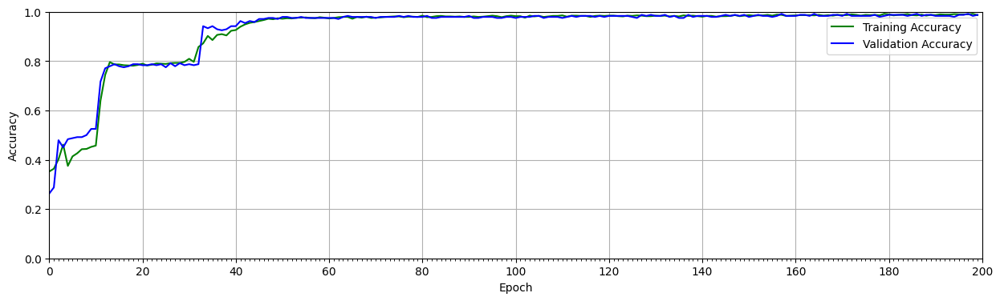

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        47
           1       0.97      0.98      0.98        63
           2       1.00      0.98      0.99        43
           3       0.99      0.99      0.99        87

    accuracy                           0.99       240
   macro avg       0.99      0.99      0.99       240
weighted avg       0.99      0.99      0.99       240


Additional Metrics:
MCC: 0.9829



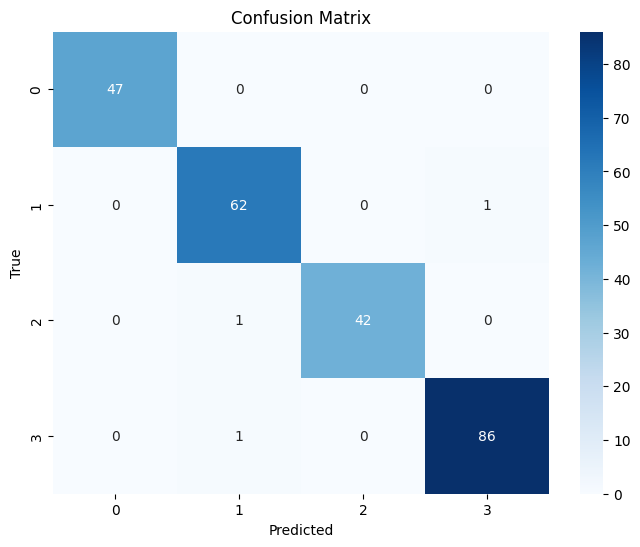

In [ ]:
def sigmoid_b5(x):
    return tfm.divide(1.0, tfm.add(1.0, tfm.exp(tfm.multiply(x, -10.0))))

actv = Activation(sigmoid_b5)

model_3 = learn(X_train, y_train, X_test, y_test, actv, actv, actv)

4
Epoch 1/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.3212 - loss: 1.4044 - precision: 0.3212 - recall: 0.3212 - val_accuracy: 0.3625 - val_loss: 1.3459 - val_precision: 0.3625 - val_recall: 0.3625
Epoch 2/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3315 - loss: 1.3388 - precision: 0.3254 - recall: 0.3315 - val_accuracy: 0.3625 - val_loss: 1.3312 - val_precision: 0.3031 - val_recall: 0.3625
Epoch 3/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3274 - loss: 1.3196 - precision: 0.2959 - recall: 0.4323 - val_accuracy: 0.3625 - val_loss: 1.3249 - val_precision: 0.3125 - val_recall: 0.6250
Epoch 4/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3189 - loss: 1.3030 - precision: 0.3342 - recall: 0.6684 - val_accuracy: 0.3625 - val_loss: 1.3204 - val_precision: 0.3125 - val_recall: 0.6250
Epoch 5/25
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3177 - loss: 1.2801 - precision: 0.3446 - recall: 0.6891 - val_accuracy: 0.3292 - val_loss: 1.3154 - 

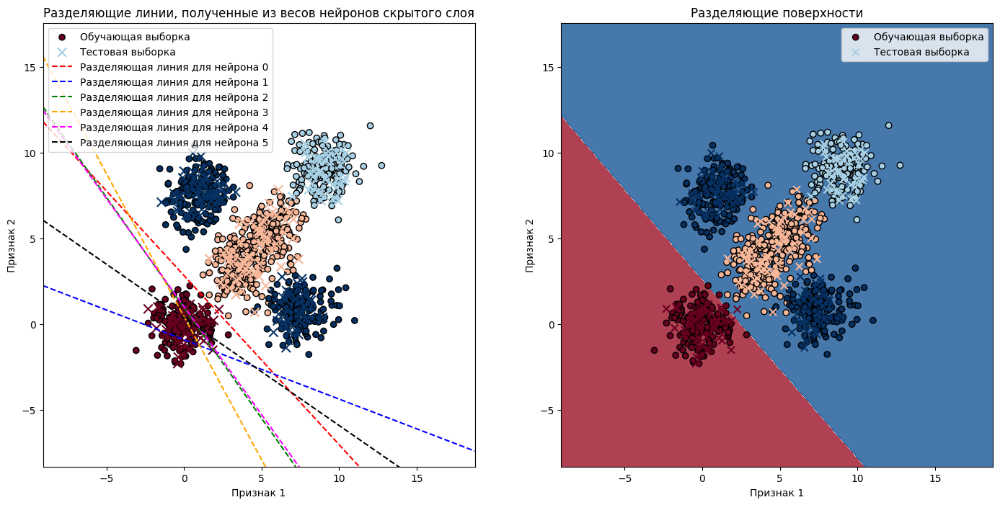

Epoch 26/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5179 - loss: 1.0356 - precision: 0.4461 - recall: 0.8251 - val_accuracy: 0.4542 - val_loss: 1.0236 - val_precision: 0.4495 - val_recall: 0.8167
Epoch 27/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5059 - loss: 1.0203 - precision: 0.4540 - recall: 0.8380 - val_accuracy: 0.4542 - val_loss: 1.0124 - val_precision: 0.4516 - val_recall: 0.8167
Epoch 28/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5285 - loss: 1.0015 - precision: 0.4574 - recall: 0.8423 - val_accuracy: 0.4542 - val_loss: 1.0034 - val_precision: 0.4527 - val_recall: 0.8167
Epoch 29/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5069 - loss: 0.9890 - precision: 0.4646 - recall: 0.8577 - val_accuracy: 0.4542 - val_loss: 0.9942 - val_precision: 0.4527 - val_recall: 0.8167
Epoch 30/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5296 - loss: 0.9751 - precision: 0.4694 - recall: 0.8574 - val_accuracy: 0.4542 - val_loss: 0.9872 

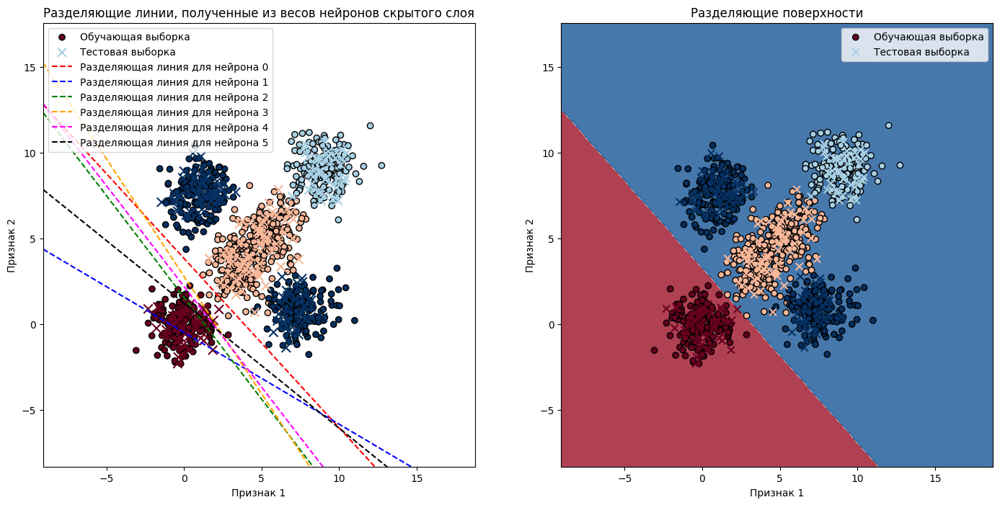

Epoch 51/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5307 - loss: 0.9174 - precision: 0.4528 - recall: 0.8251 - val_accuracy: 0.4583 - val_loss: 0.9042 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 52/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5177 - loss: 0.9259 - precision: 0.4518 - recall: 0.8279 - val_accuracy: 0.4583 - val_loss: 0.9017 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 53/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5159 - loss: 0.9174 - precision: 0.4553 - recall: 0.8364 - val_accuracy: 0.4583 - val_loss: 0.9020 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 54/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4789 - loss: 0.9415 - precision: 0.4403 - recall: 0.8156 - val_accuracy: 0.4583 - val_loss: 0.9004 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 55/75
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4877 - loss: 0.9179 - precision: 0.4538 - recall: 0.8367 - val_accuracy: 0.4583 - val_loss: 0.8981 

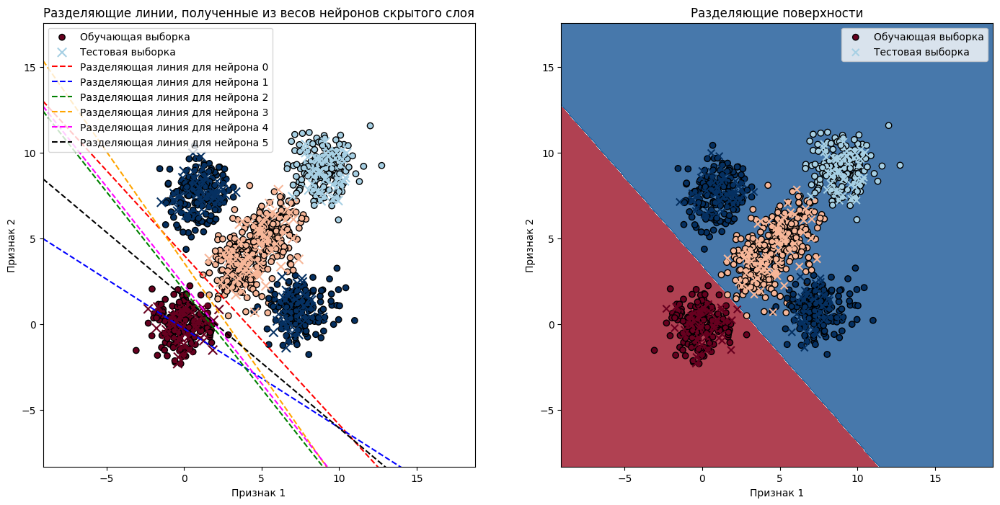

Epoch 76/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5068 - loss: 0.9117 - precision: 0.4513 - recall: 0.8364 - val_accuracy: 0.4583 - val_loss: 0.8813 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 77/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5176 - loss: 0.8773 - precision: 0.4611 - recall: 0.8357 - val_accuracy: 0.4583 - val_loss: 0.8810 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 78/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5030 - loss: 0.9019 - precision: 0.4539 - recall: 0.8325 - val_accuracy: 0.4583 - val_loss: 0.8808 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 79/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5470 - loss: 0.8794 - precision: 0.4663 - recall: 0.8536 - val_accuracy: 0.4583 - val_loss: 0.8806 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 80/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5207 - loss: 0.9073 - precision: 0.4547 - recall: 0.8450 - val_accuracy: 0.4583 - val_loss: 0.

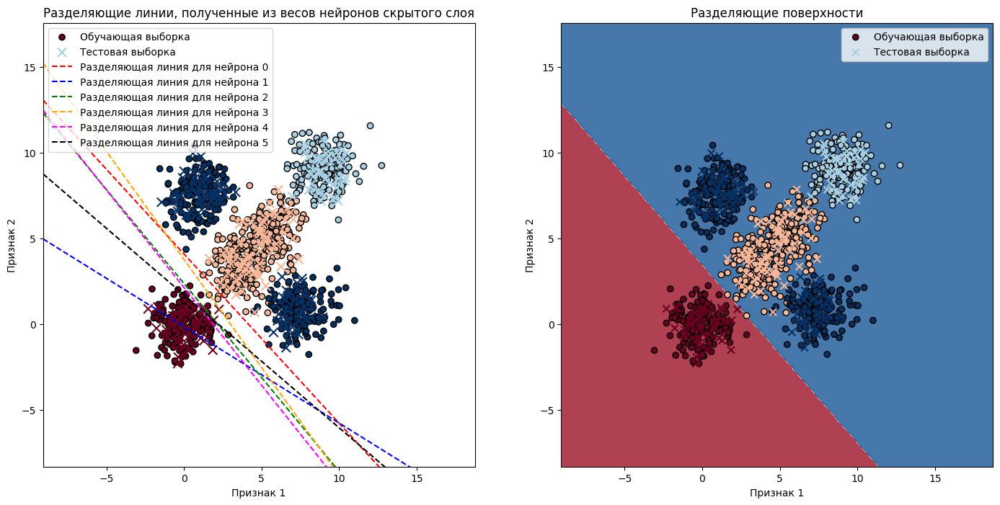

Epoch 101/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4966 - loss: 0.8961 - precision: 0.4528 - recall: 0.8330 - val_accuracy: 0.4583 - val_loss: 0.8730 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 102/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4851 - loss: 0.9228 - precision: 0.4384 - recall: 0.8028 - val_accuracy: 0.4583 - val_loss: 0.8738 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 103/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5001 - loss: 0.9027 - precision: 0.4475 - recall: 0.8245 - val_accuracy: 0.4583 - val_loss: 0.8738 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 104/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5150 - loss: 0.8848 - precision: 0.4590 - recall: 0.8381 - val_accuracy: 0.4583 - val_loss: 0.8738 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 105/125
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5125 - loss: 0.9082 - precision: 0.4449 - recall: 0.8224 - val_accuracy: 0.4583 - val_los

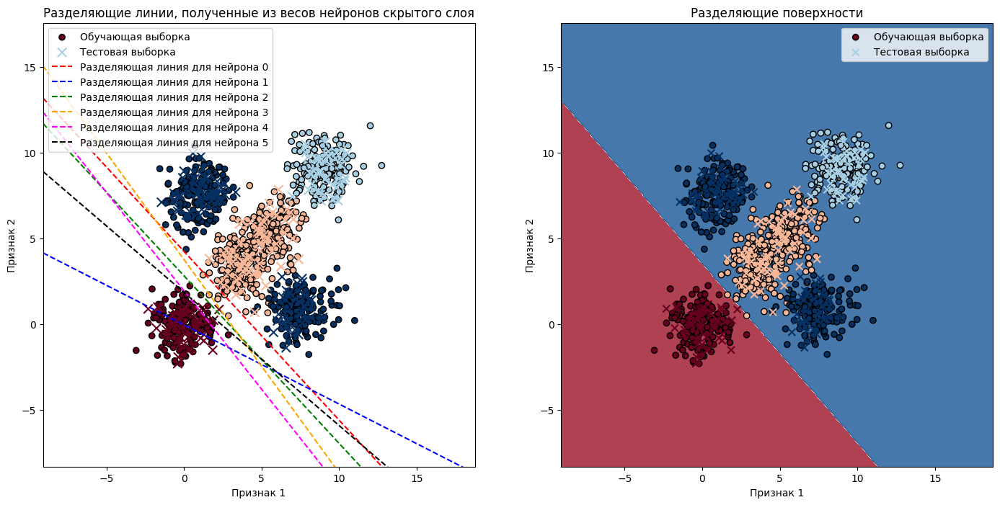

Epoch 126/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5170 - loss: 0.8858 - precision: 0.4596 - recall: 0.8475 - val_accuracy: 0.4583 - val_loss: 0.8691 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 127/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4881 - loss: 0.9021 - precision: 0.4432 - recall: 0.8121 - val_accuracy: 0.4583 - val_loss: 0.8695 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 128/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5125 - loss: 0.8943 - precision: 0.4475 - recall: 0.8170 - val_accuracy: 0.4583 - val_loss: 0.8701 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 129/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5296 - loss: 0.8739 - precision: 0.4620 - recall: 0.8469 - val_accuracy: 0.4583 - val_loss: 0.8687 - val_precision: 0.4550 - val_recall: 0.8208
Epoch 130/150
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4605 - loss: 0.9172 - precision: 0.4364 - recall: 0.8041 - val_accuracy: 0.4583 - val_los

KeyboardInterrupt: 

In [ ]:
model_4 = learn(X_train, y_train, X_test, y_test, 'sigmoid', 'sigmoid', 'sigmoid', ['precision', 'recall'])

weights, biases = model_4.layers[-1].get_weights()
print("Весовая матрица выходного слоя:\n", weights)
print("Смещения выходного слоя:\n", biases)
print()

In [ ]:
weights, biases = model_3.layers[0].get_weights()
print("Весовая матрица скрытого слоя:\n", weights)
print("Смещения скрытого слоя:\n", biases)
print()

Весовая матрица скрытого слоя:
 [[ 0.37618333 -0.04435106  0.26032576  0.08708835 -0.05491354  0.38548228]
 [ 0.16081184  0.17493612  0.21341044  0.0866795  -0.07605572 -0.15052266]]
Смещения скрытого слоя:
 [ 0.5411867  -0.19258262 -0.68132216 -0.54734486  0.91942966 -0.08571697]



0.37618333 0.16081184 0.5411867
-0.044351064 0.17493612 -0.19258262
0.26032576 0.21341044 -0.68132216
0.087088354 0.0866795 -0.54734486
-0.054913536 -0.07605572 0.91942966
0.38548228 -0.15052266 -0.08571697


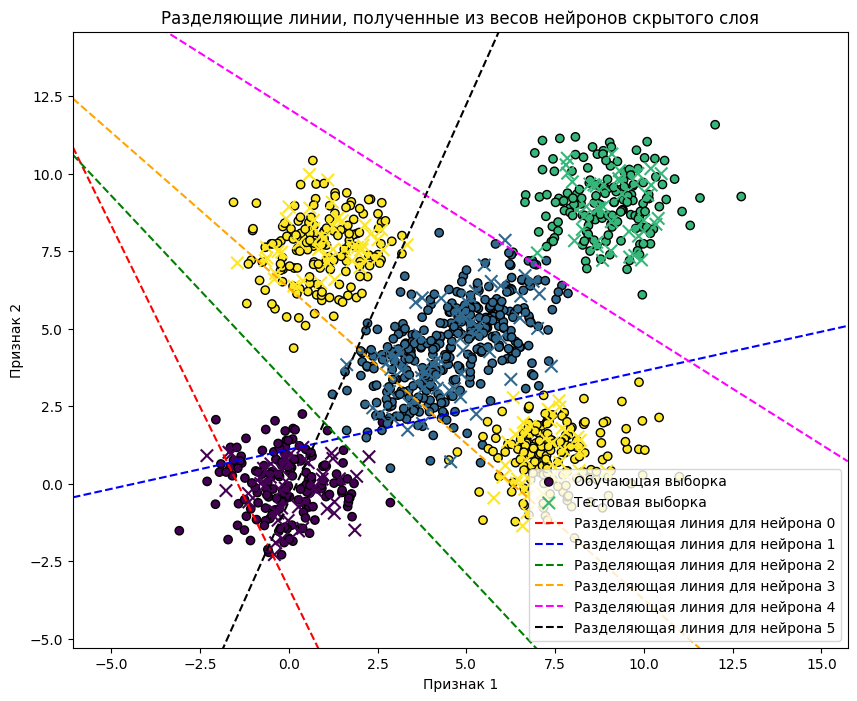

In [ ]:
x_min, x_max = X[:, 0].min() - 3, X[:, 0].max() + 3
y_min, y_max = X[:, 1].min() - 3, X[:, 1].max() + 3

# Для каждого скрытого нейрона разделяющая линия определяется уравнением:
#  w1*x1 + w2*x2 + b = 0  =>  x2 = -(w1/w2)*x1 - b/w2
x_vals = np.linspace(x_min, x_max, 100)

plt.figure(figsize=(10,8))
plt.scatter(X_train[:,0], X_train[:,1], c=np.argmax(y_train, axis=1), edgecolors='k', label='Обучающая выборка')
plt.scatter(X_test[:,0], X_test[:,1], c=np.argmax(y_test, axis=1), marker='x', s=80, label='Тестовая выборка')
colors = ['red', 'blue', 'green', 'orange', 'magenta', 'black']
for i in range(len(weights[0])):
    w1, w2 = weights[0][i], weights[1][i]
    b = biases[i]
    print(w1, w2, b)

    if np.abs(w2) > 1e-6:
        #y_vals = -(w[1]/w[0])*x_vals - (10*b)/w[0]
        y_vals = (-w1*x_vals-b)/w2
        plt.plot(x_vals, y_vals, color=colors[i], linestyle='--',
                 label=f'Разделяющая линия для нейрона {i}')
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.title("Разделяющие линии, полученные из весов нейронов скрытого слоя")
plt.xlabel("Признак 1")
plt.ylabel("Признак 2")
plt.legend()
plt.show()


In [ ]:
 partial_model = tensorflow.keras.Model(
        inputs=model_3.input,
        outputs=model_3.layers[1].output)

xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = partial_model.predict(np.c_[xx.ravel(), yy.ravel()], verbose=1)
Z = np.argmax(Z, axis=1).reshape(xx.shape)

plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=.8)
plt.scatter(X_train[:, 0], X_train[:, 1], c=np.argmax(y_train, axis=1), cmap=plt.cm.RdBu, edgecolors='k', label='Обучающая выборка')
plt.scatter(X_test[:, 0], X_test[:, 1], c=np.argmax(y_test, axis=1), cmap=plt.cm.RdBu, marker='x', s=50, label='Тестовая выборка')
plt.show()

AttributeError: The layer sequential_16 has never been called and thus has no defined input.

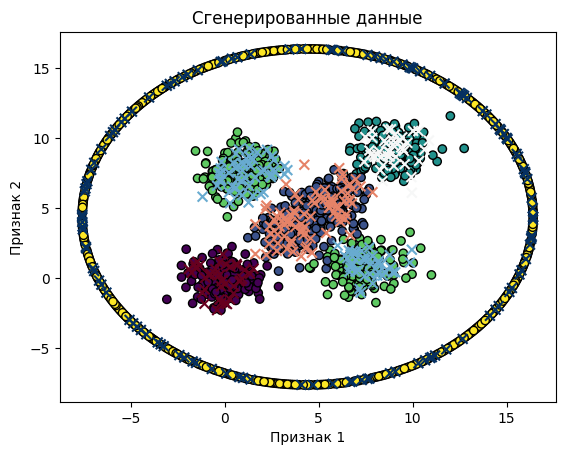

In [ ]:
center_x, center_y = np.mean(X[:, 0]), np.mean(X[:, 1])
r = 12
max_class = np.max(y)

X_new, y_new = X, y

for angle in np.linspace(0, 2*math.pi, 720):
    X_new = np.vstack([X_new, [center_x+r*math.cos(angle), center_y+r*math.sin(angle)]])
    y_new = np.hstack([y_new, np.asarray([max_class+1]).reshape((1,))])

X_train_new, X_test_new, y_train_new_src, y_test_new_src = train_test_split(X_new, y_new, test_size=0.2)

plt.scatter(X_train_new[:, 0], X_train_new[:, 1], c=y_train_new_src, edgecolors='k', label='Обучающая выборка')
plt.scatter(X_test_new[:, 0], X_test_new[:, 1], c=y_test_new_src, cmap=plt.cm.RdBu, marker='x', s=50, label='Тестовая выборка')
plt.title('Сгенерированные данные')
plt.xlabel('Признак 1')
plt.ylabel('Признак 2')
plt.show()

y_train_new = to_categorical(y_train_new_src, num_classes+1)
y_test_new = to_categorical(y_test_new_src, num_classes+1)

5
Epoch 1/25
96/96 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.2999 - loss: 1.6623 - precision: 0.8272 - recall: 0.1287 - val_accuracy: 0.4010 - val_loss: 1.4553 - val_precision: 0.7222 - val_recall: 0.1354
Epoch 2/25
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3954 - loss: 1.4282 - precision: 0.7849 - recall: 0.1368 - val_accuracy: 0.4036 - val_loss: 1.4064 - val_precision: 1.0000 - val_recall: 0.0625
Epoch 3/25
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4026 - loss: 1.4137 - precision: 0.9767 - recall: 0.1089 - val_accuracy: 0.4115 - val_loss: 1.3868 - val_precision: 0.9231 - val_recall: 0.1250
Epoch 4/25
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4157 - loss: 1.3807 - precision: 0.9312 - recall: 0.1220 - val_accuracy: 0.4062 - val_loss: 1.3684 - val_precision: 0.9091 - val_recall: 0.1302
Epoch 5/25
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4463 - loss: 1.3508 - precision: 0.9328 - recall: 0.1401 - val_accuracy: 0.4297 - val_loss: 1.3411 - 

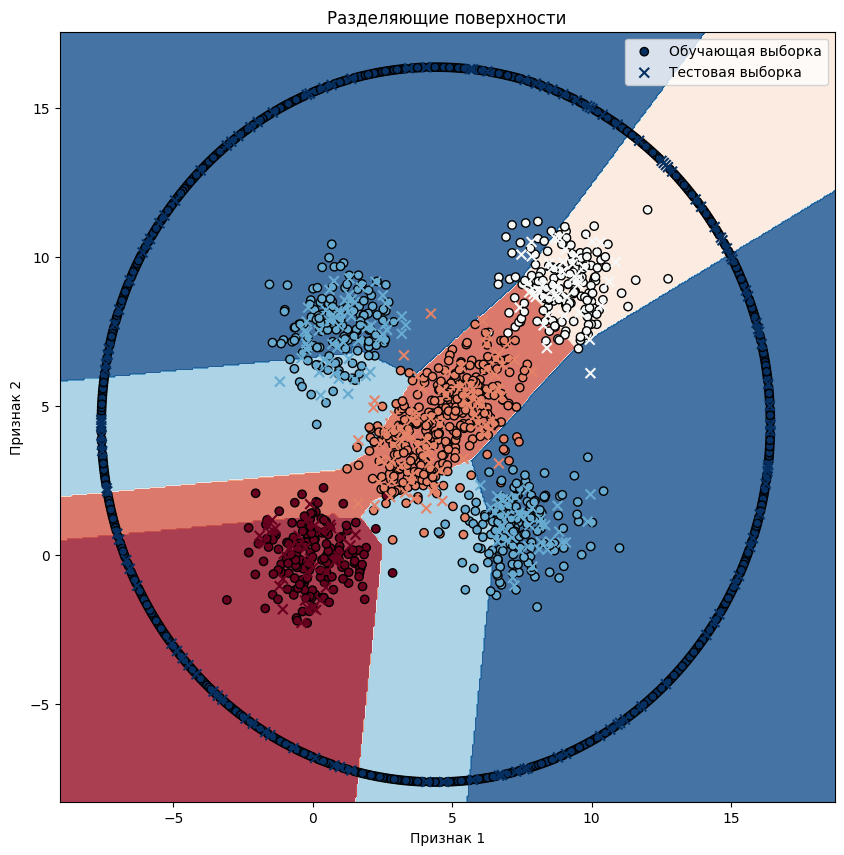

Epoch 26/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6370 - loss: 0.8469 - precision: 0.6847 - recall: 0.2784 - val_accuracy: 0.6432 - val_loss: 0.8414 - val_precision: 0.6162 - val_recall: 0.3177
Epoch 27/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6746 - loss: 0.8138 - precision: 0.6753 - recall: 0.3812 - val_accuracy: 0.6667 - val_loss: 0.8225 - val_precision: 0.6812 - val_recall: 0.3672
Epoch 28/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6876 - loss: 0.8045 - precision: 0.7004 - recall: 0.4102 - val_accuracy: 0.6589 - val_loss: 0.8110 - val_precision: 0.6776 - val_recall: 0.3776
Epoch 29/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6860 - loss: 0.7891 - precision: 0.7368 - recall: 0.4524 - val_accuracy: 0.7240 - val_loss: 0.7955 - val_precision: 0.7657 - val_recall: 0.4766
Epoch 30/50
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7326 - loss: 0.7633 - precision: 0.7609 - recall: 0.5185 - val_accuracy: 0.7370 - val_loss: 0.7821 

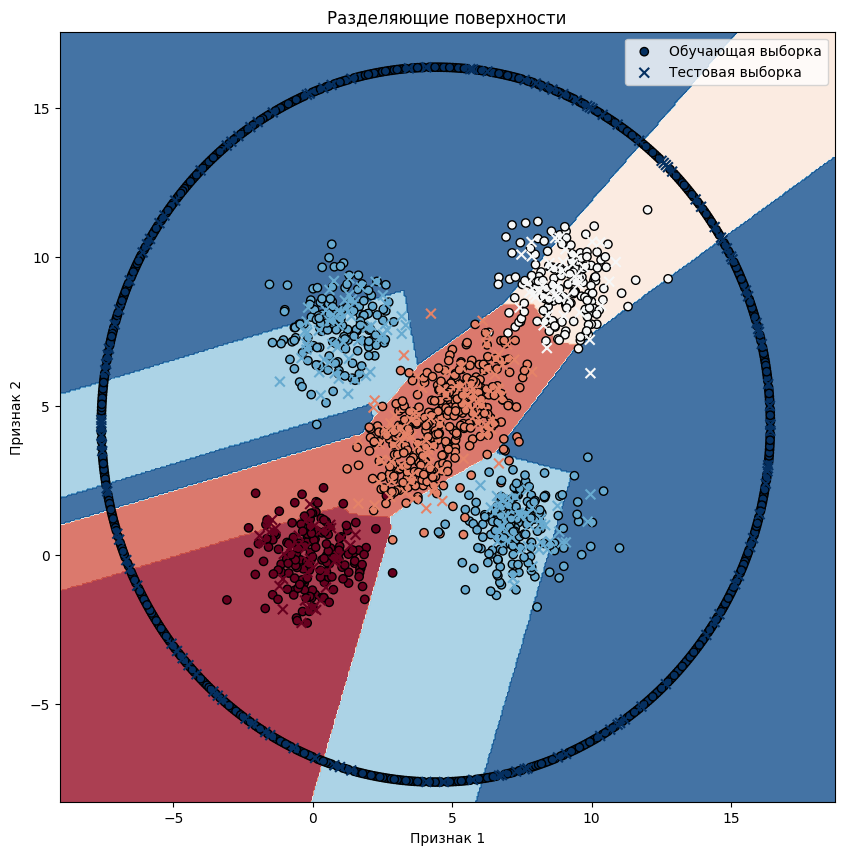

Epoch 51/75
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7986 - loss: 0.6213 - precision: 0.8238 - recall: 0.7306 - val_accuracy: 0.8047 - val_loss: 0.6319 - val_precision: 0.8373 - val_recall: 0.7370
Epoch 52/75
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.8022 - loss: 0.5955 - precision: 0.8382 - recall: 0.7596 - val_accuracy: 0.8099 - val_loss: 0.6214 - val_precision: 0.8391 - val_recall: 0.7604
Epoch 53/75
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7957 - loss: 0.5976 - precision: 0.8203 - recall: 0.7436 - val_accuracy: 0.8073 - val_loss: 0.6197 - val_precision: 0.8363 - val_recall: 0.7448
Epoch 54/75
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8058 - loss: 0.6076 - precision: 0.8338 - recall: 0.7646 - val_accuracy: 0.8099 - val_loss: 0.6136 - val_precision: 0.8357 - val_recall: 0.7552
Epoch 55/75
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7964 - loss: 0.6047 - precision: 0.8227 - recall: 0.7596 - val_accuracy: 0.8203 - val_loss: 0.6022 

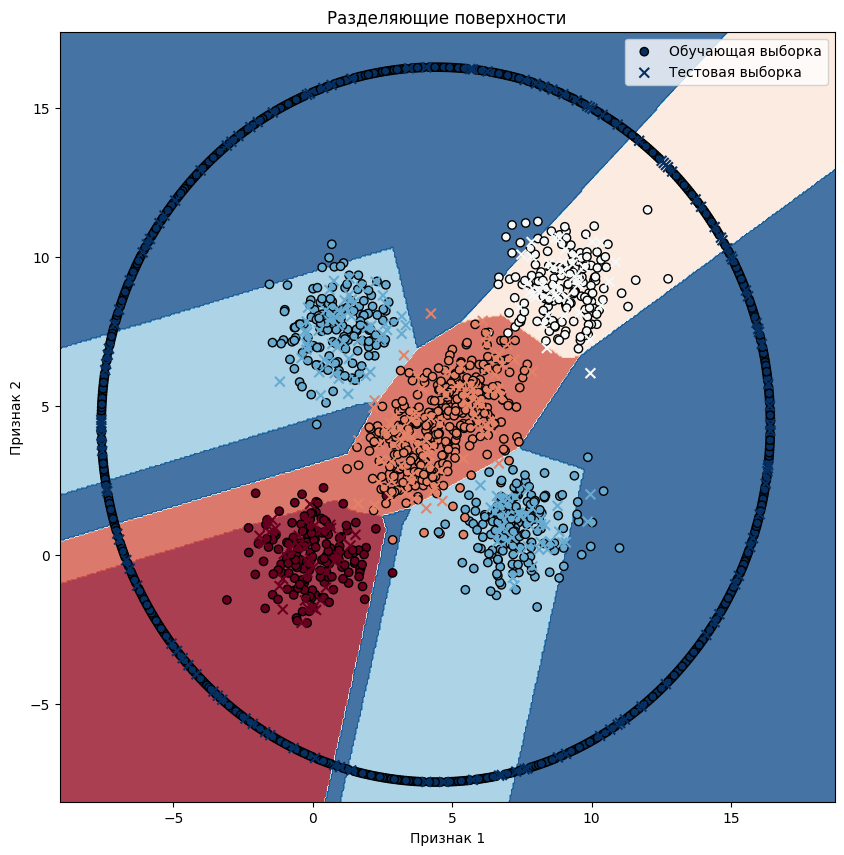

Epoch 76/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8364 - loss: 0.4796 - precision: 0.8540 - recall: 0.7967 - val_accuracy: 0.8411 - val_loss: 0.4833 - val_precision: 0.8575 - val_recall: 0.7839
Epoch 77/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8176 - loss: 0.4934 - precision: 0.8356 - recall: 0.7846 - val_accuracy: 0.8438 - val_loss: 0.4747 - val_precision: 0.8631 - val_recall: 0.8047
Epoch 78/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.8235 - loss: 0.4805 - precision: 0.8482 - recall: 0.7888 - val_accuracy: 0.8438 - val_loss: 0.4689 - val_precision: 0.8659 - val_recall: 0.8073
Epoch 79/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8335 - loss: 0.4666 - precision: 0.8501 - recall: 0.7947 - val_accuracy: 0.8438 - val_loss: 0.4737 - val_precision: 0.8575 - val_recall: 0.7995
Epoch 80/100
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8153 - loss: 0.4736 - precision: 0.8237 - recall: 0.7667 - val_accuracy: 0.8464 - val_loss: 0.

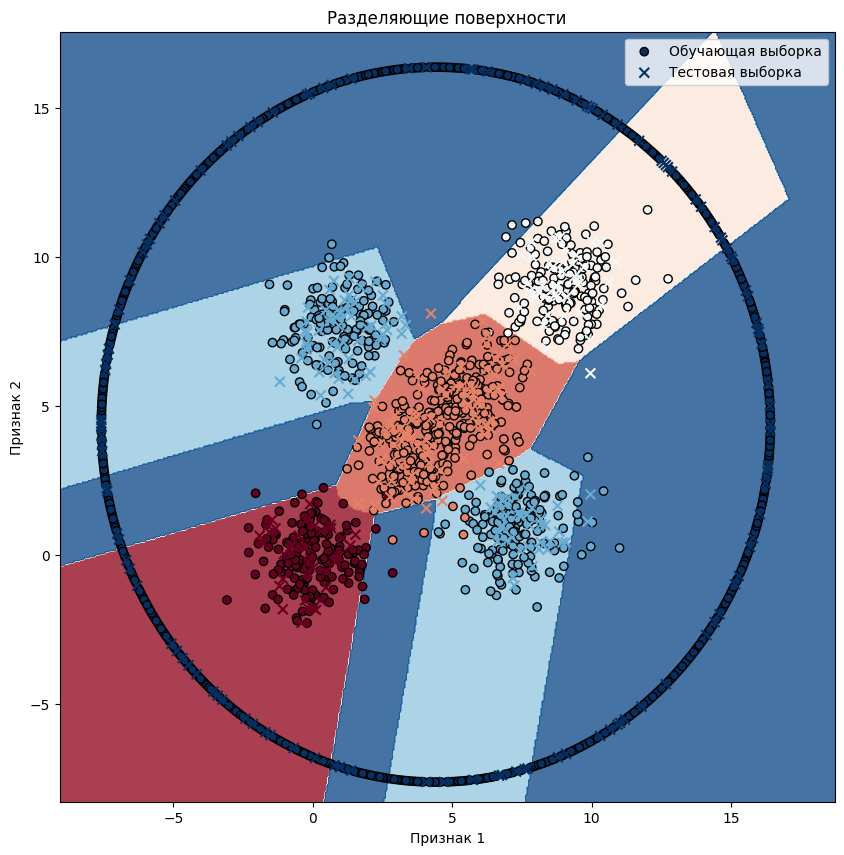

Epoch 101/125
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8351 - loss: 0.4005 - precision: 0.8410 - recall: 0.8165 - val_accuracy: 0.8568 - val_loss: 0.3901 - val_precision: 0.8614 - val_recall: 0.8255
Epoch 102/125
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8601 - loss: 0.3663 - precision: 0.8680 - recall: 0.8462 - val_accuracy: 0.8568 - val_loss: 0.3881 - val_precision: 0.8622 - val_recall: 0.8307
Epoch 103/125
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8423 - loss: 0.3829 - precision: 0.8503 - recall: 0.8223 - val_accuracy: 0.8620 - val_loss: 0.3850 - val_precision: 0.8672 - val_recall: 0.8333
Epoch 104/125
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8352 - loss: 0.4041 - precision: 0.8403 - recall: 0.8173 - val_accuracy: 0.8880 - val_loss: 0.3832 - val_precision: 0.8946 - val_recall: 0.8620
Epoch 105/125
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8501 - loss: 0.3887 - precision: 0.8578 - recall: 0.8273 - val_accuracy: 0.8620 - val_los

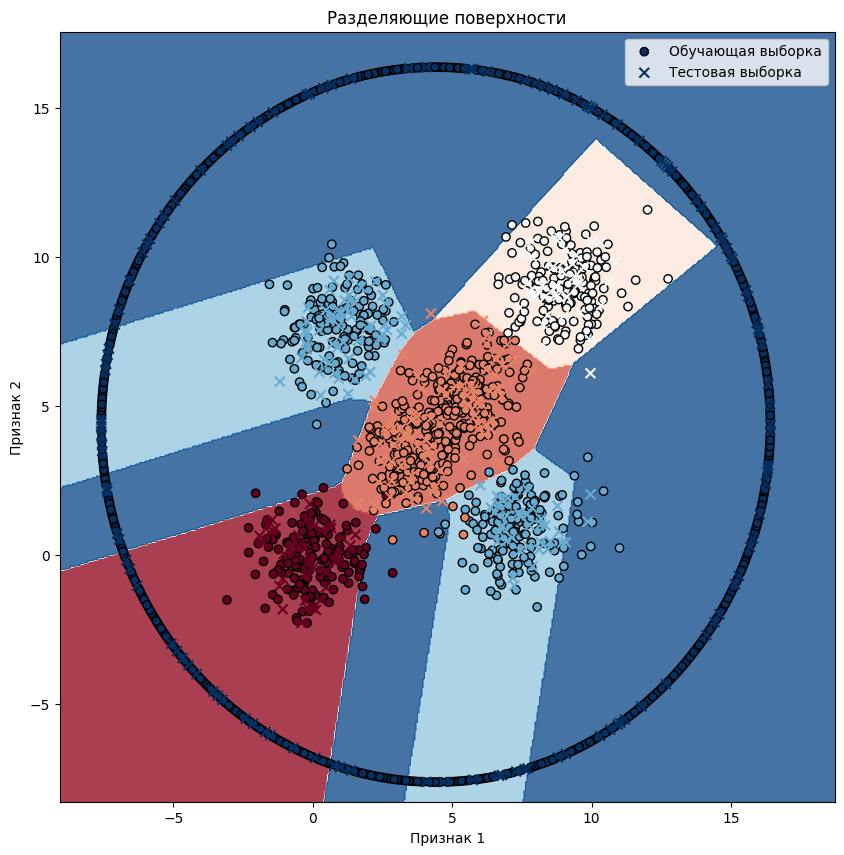

Epoch 126/150
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8662 - loss: 0.3584 - precision: 0.8702 - recall: 0.8534 - val_accuracy: 0.8906 - val_loss: 0.3375 - val_precision: 0.8963 - val_recall: 0.8776
Epoch 127/150
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8698 - loss: 0.3390 - precision: 0.8748 - recall: 0.8609 - val_accuracy: 0.8906 - val_loss: 0.3383 - val_precision: 0.8963 - val_recall: 0.8776
Epoch 128/150
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8690 - loss: 0.3436 - precision: 0.8742 - recall: 0.8612 - val_accuracy: 0.8854 - val_loss: 0.3389 - val_precision: 0.8984 - val_recall: 0.8750
Epoch 129/150
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8813 - loss: 0.3184 - precision: 0.8863 - recall: 0.8715 - val_accuracy: 0.8880 - val_loss: 0.3343 - val_precision: 0.8936 - val_recall: 0.8750
Epoch 130/150
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8498 - loss: 0.3634 - precision: 0.8571 - recall: 0.8369 - val_accuracy: 0.8958 - val_los

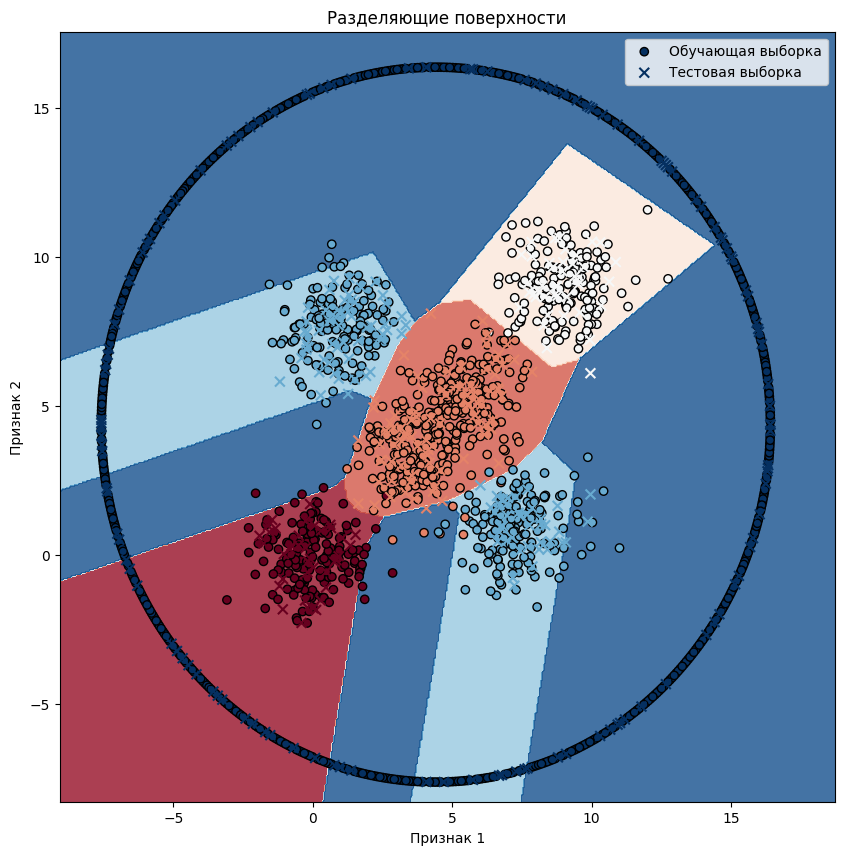

Epoch 151/175
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8618 - loss: 0.3375 - precision: 0.8677 - recall: 0.8567 - val_accuracy: 0.8984 - val_loss: 0.3059 - val_precision: 0.9019 - val_recall: 0.8854
Epoch 152/175
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.8749 - loss: 0.3218 - precision: 0.8765 - recall: 0.8670 - val_accuracy: 0.8958 - val_loss: 0.3081 - val_precision: 0.8989 - val_recall: 0.8802
Epoch 153/175
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8845 - loss: 0.3072 - precision: 0.8876 - recall: 0.8787 - val_accuracy: 0.8932 - val_loss: 0.3034 - val_precision: 0.8992 - val_recall: 0.8828
Epoch 154/175
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8777 - loss: 0.3089 - precision: 0.8818 - recall: 0.8722 - val_accuracy: 0.8958 - val_loss: 0.3009 - val_precision: 0.9019 - val_recall: 0.8854
Epoch 155/175
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8770 - loss: 0.3042 - precision: 0.8784 - recall: 0.8719 - val_accuracy: 0.8932 - val_los

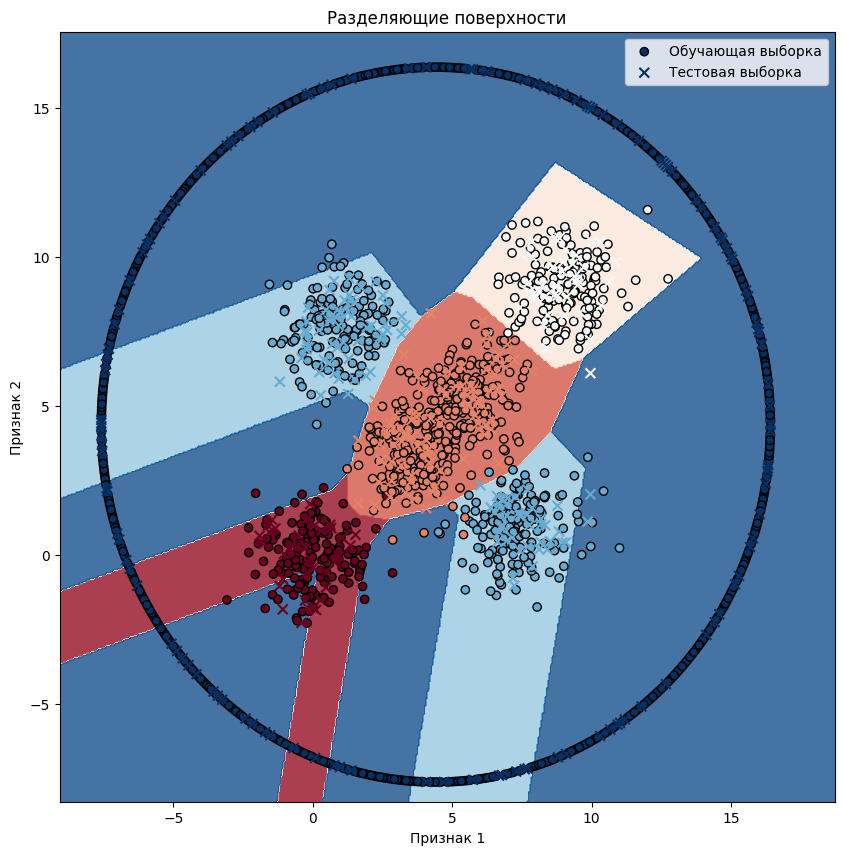

Epoch 176/200
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8947 - loss: 0.2893 - precision: 0.9080 - recall: 0.8793 - val_accuracy: 0.9167 - val_loss: 0.2882 - val_precision: 0.9304 - val_recall: 0.8698
Epoch 177/200
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8947 - loss: 0.2858 - precision: 0.9066 - recall: 0.8617 - val_accuracy: 0.9193 - val_loss: 0.2829 - val_precision: 0.9311 - val_recall: 0.8802
Epoch 178/200
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8871 - loss: 0.2984 - precision: 0.9055 - recall: 0.8549 - val_accuracy: 0.9193 - val_loss: 0.2798 - val_precision: 0.9313 - val_recall: 0.8828
Epoch 179/200
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8935 - loss: 0.2947 - precision: 0.8963 - recall: 0.8835 - val_accuracy: 0.9219 - val_loss: 0.2858 - val_precision: 0.9233 - val_recall: 0.9089
Epoch 180/200
96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8876 - loss: 0.2932 - precision: 0.9010 - recall: 0.8667 - val_accuracy: 0.9193 - val_los

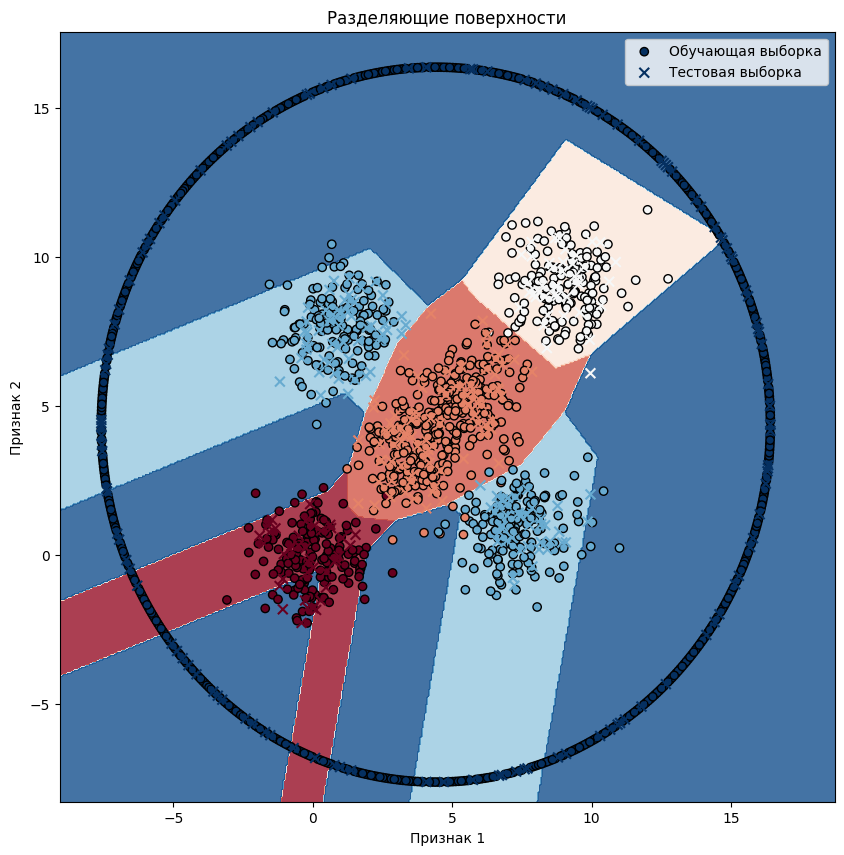

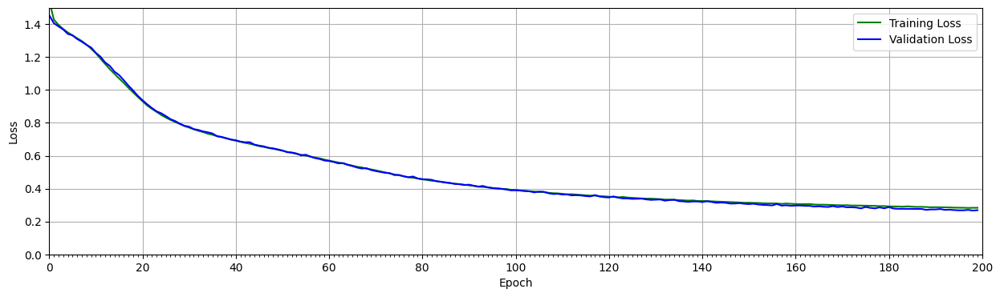

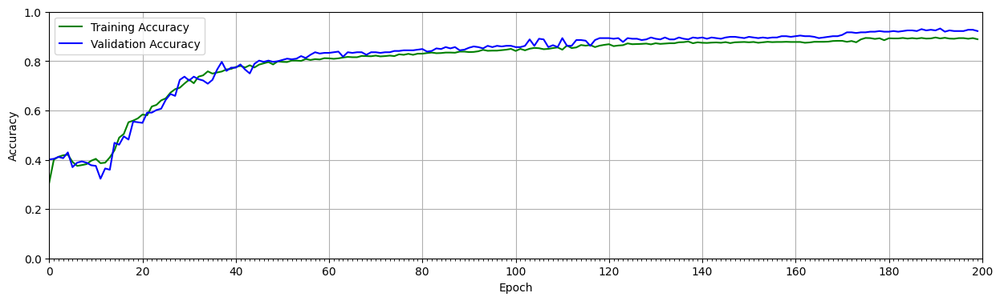

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.87      0.89        39
           1       0.99      1.00      0.99        84
           2       0.95      0.98      0.96        41
           3       0.85      0.98      0.91        95
           4       0.94      0.82      0.88       125

    accuracy                           0.92       384
   macro avg       0.93      0.93      0.93       384
weighted avg       0.93      0.92      0.92       384


Additional Metrics:
MCC: 0.8998



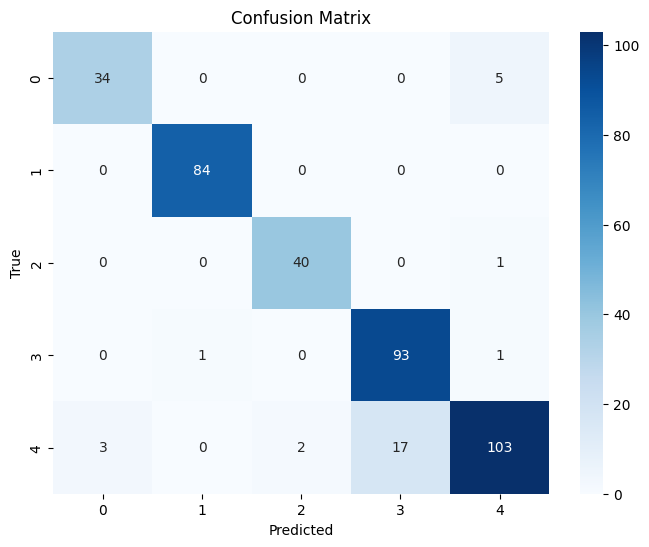

In [ ]:
model_5 = learn(X_train_new, y_train_new, X_test_new, y_test_new, 'relu', 'relu', 'softmax', ['precision', 'recall'])

In [ ]:
X_user = np.array([
    [0, 0],
    [12, -3],
    [15, -4],
    [-5, 13]
], dtype=np.float64)

y_pred = model_5.predict(X_user)
np.argmax(y_pred, axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


array([0, 4, 4, 4])

In [ ]:
h=0.1
x_min, x_max = X_new[:, 0].min() - 3, X_new[:, 0].max() + 3
y_min, y_max = X_new[:, 1].min() - 3, X_new[:, 1].max() + 3
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = model_5.predict(np.c_[xx.ravel(), yy.ravel()], verbose=1)
Z = np.argmax(Z, axis=1).reshape(xx.shape)

2813/2813 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step


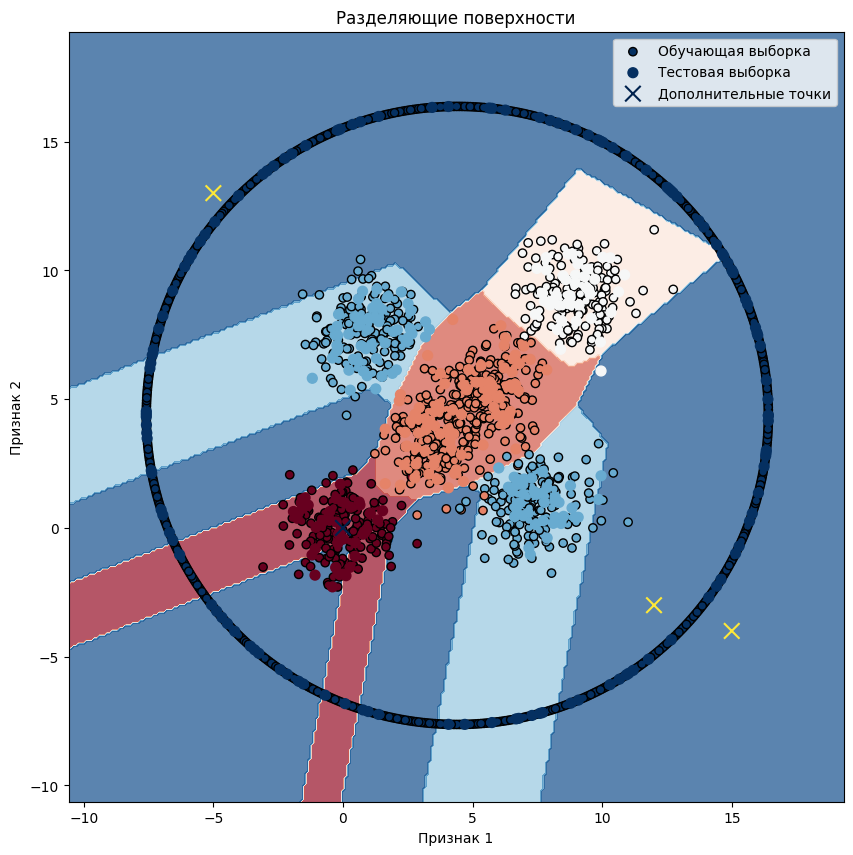

In [ ]:
plt.figure(figsize=(10, 10))
plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=.7)
plt.scatter(X_train_new[:, 0], X_train_new[:, 1], c=np.argmax(y_train_new, axis=1), cmap=plt.cm.RdBu, edgecolors='k', label='Обучающая выборка')
plt.scatter(X_test_new[:, 0], X_test_new[:, 1], c=np.argmax(y_test_new, axis=1), cmap=plt.cm.RdBu, s=50, label='Тестовая выборка')
plt.scatter(X_user[:, 0], X_user[:, 1], c=np.argmax(y_pred, axis=1), cmap=plt.cm.cividis, marker='x', s=125, label='Дополнительные точки')
plt.title(f'Разделяющие поверхности')
plt.xlabel('Признак 1')
plt.ylabel('Признак 2')
plt.legend()
plt.show()